## Useful methods

In [1]:
# Exportation of libraries
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import numpy as np
import pandas as pd
import csv

import os
import subprocess
import sys
from joblib import Parallel, delayed
from tqdm import tqdm
import re
from collections import defaultdict
from concurrent.futures import ProcessPoolExecutor, as_completed

from scipy.stats import mannwhitneyu
from scipy.stats import pearsonr
import seaborn as sns

In [2]:


pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)   
pd.set_option('display.max_rows', None)


plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42
pd.set_option("display.width", 500)
pd.set_option('future.no_silent_downcasting', True)

sns.set(style="white")

l_colors = [
    "#1f77b4", "#ff7f0e", "#2ca02c", "#d62728", "#9467bd",
    "#8c564b", "#e377c2", "#7f7f7f", "#bcbd22", "#17becf",
    "#c64bb9", "#ffbb78", "#98df8a", "#ff9896", "#c5b0d5",
    "#c49c94", "#f7b6d2", "#c7c7c7", "#dbdb8d", "#9edae5",
    "#393b79", "#637939", "#8c6bb1", "#810f7c", "#4d4d4d",
    "#5254a3", "#f4a582", "#99d8c9", "#ca9161", "#bab0ac"
]

column_mapping = {
    "U_Min": "MinTraining",
    "U_Avg": "AvgTraining",
    "U_Max": "MaxTraining",
    "U_Min.1": "MinValidation",
    "U_Avg.1": "AvgValidation",
    "U_Max.1": "MaxValidation",
    "R_Min": "MinTrainingScore",
    "R_Avg": "AvgTrainingScore",
    "R_Max": "MaxTrainingScore",
    "R_Min.1": "MinValidationScore",
    "R_Avg.1": "AvgValidationScore",
    "R_Max.1": "MaxValidationScore",
    "Min": "MinTraining",
    "Avg": "AvgTraining",
    "Max": "MaxTraining",
    "Min.1": "MinValidation",
    "Avg.1": "AvgValidation",
    "Max.1": "MaxValidation",
}

beautifulEnvName = {
    "inverted_double_pendulum": "Inverted Double Pendulum",
    "hopper": "Hopper",
    "half_cheetah": "Half Cheetah",
    "walker2d": "Walker 2D",
    "ant": "Ant",
    "humanoid": "Humanoid"
}


In [3]:
def parse_markdown_to_dataframe_unique(filepath):
    """
    Parse a single PolicyStats file (without 'Generation' headers)
    and return a pandas DataFrame with all the relevant metrics.
    """

    # Initialize dictionary for storing metrics
    gen_data = {
        "Teams": 0, "Edges": 0, "Actions": 0, "Stages": 0,
        "ContextProgram": 0, "ContextLine": None, "ContextIntr": None, 
        "ContextUse": None, "ContextInstr": None,
        "ActionProgram": 0, "ActionLine": None, "ActionIntr": None, "ActionUse": None, "ActionInstr": None,
        "DH0accesses": None, "DH0loc": None, "DH1accesses": None, "DH1loc": None
    }

    contextAnalysed = True  # Flag to switch between context and action program sections

    with open(filepath, 'r') as file:
        for line in file:
            line = line.strip()

            # === Topology info ===
            if line.startswith("Teams:"):
                gen_data["Teams"] = int(line.split()[-1])
            elif line.startswith("Edges:"):
                gen_data["Edges"] = int(line.split()[-1])
            elif line.startswith("Actions:"):
                gen_data["Actions"] = int(line.split()[-1])
            elif line.startswith("Stages"):
                gen_data["Stages"] = int(line.split()[-1])

            # === Context Program info ===
            elif "Context Program" in line:
                contextAnalysed = True
            elif line.startswith("Programs:") and contextAnalysed:
                gen_data["ContextProgram"] = int(line.split()[-1])
            elif line.startswith("Line/prog") and contextAnalysed:
                gen_data["ContextLine"] = float(line.split()[-1]) if 'nan' not in line else None
            elif line.startswith("Intr/prog") and contextAnalysed:
                gen_data["ContextIntr"] = float(line.split()[-1]) if 'nan' not in line else None
            elif line.startswith("Use/prog") and contextAnalysed:
                value = line.split()[-1] if len(line.split()) > 1 else "0"
                gen_data["ContextUse"] = float(value) if value.replace('.', '', 1).isdigit() else 0
            elif line.startswith("Use/instr") and contextAnalysed:
                values = re.findall(r"\{(\d+),(\d+)\}", line)
                gen_data["ContextInstr"] = len(values)
                for i, (a, b) in enumerate(values):
                    gen_data[f"ContextInstr_{i}"] = f"{a},{b}"

            # === Action Program info ===
            elif "Action Program" in line:
                contextAnalysed = False
            elif line.startswith("Programs:") and not contextAnalysed:
                gen_data["ActionProgram"] = int(line.split()[-1])
            elif line.startswith("Line/prog") and not contextAnalysed:
                gen_data["ActionLine"] = float(line.split()[-1]) if 'nan' not in line else None
            elif line.startswith("Intr/prog") and not contextAnalysed:
                gen_data["ActionIntr"] = float(line.split()[-1]) if 'nan' not in line else None
            elif line.startswith("Use/prog") and not contextAnalysed:
                gen_data["ActionUse"] = float(line.split()[-1])
            elif line.startswith("Use/instr") and not contextAnalysed:
                values = re.findall(r"\{(\d+),(\d+)\}", line)
                gen_data["ActionInstr"] = len(values)
                for a, b in values:
                    gen_data[f"ActionInstr_{a}"] = int(b)


    # === Convert to DataFrame ===
    df = pd.DataFrame([gen_data]).fillna(0).infer_objects(copy=False)

    # Column order for clean output
    columns_order = [
        "ActionProgram", "ActionLine", "ActionIntr", "ActionUse", "ActionInstr"
    ]

    df = df.reindex(columns=columns_order)
    df = df[["ActionProgram", "ActionLine", "ActionIntr", "ActionInstr"]]


    df["ActionLineUseful"] = (df["ActionLine"] - df["ActionIntr"]) * df["ActionProgram"]

    return df


In [4]:
def parse_markdown_to_dataframe(filepath, nbGen=100000):
    # Initialiser des listes pour stocker les informations
    generations = []

    contextAnalised = True
    
    # Ouvrir le fichier et lire ligne par ligne
    with open(filepath, 'r') as file:
        gen_data = {}
        for line in file:
            # Suppression des espaces en début/fin
            line = line.strip()


            # Détection des débuts de génération et initialisation du dictionnaire
            if line.startswith("Generation"):
                if gen_data:
                    generations.append(gen_data)  # Ajouter l'ancienne génération

                    if gen_data["Gen"] == nbGen:
                        break
                gen_data = {
                    "Gen": int(line.split()[1]),
                    "Score": float(line.split()[-1]),
                    "Teams": 0, "Edges": 0, "Actions": 0, "Stages": 0,
                    "ContextProgram": 0, "ContextLine": None, "ContextIntr": None, 
                    "ContextUse": None, "ContextInstr": None,
                    "ActionProgram": 0, "ActionLine": None, "ActionIntr": None, "ActionUse": None, 
                    "DH0accesses": None, "DH0loc": None, "DH1accesses": None, "DH1loc": None
                }

            # Topology Info
            elif line.startswith("Teams:"):
                gen_data["Teams"] = int(line.split()[-1])
            elif line.startswith("Edges:"):
                gen_data["Edges"] = int(line.split()[-1])
            elif line.startswith("Actions:"):
                gen_data["Actions"] = int(line.split()[-1])
            elif line.startswith("Stages"):
                gen_data["Stages"] = int(line.split()[-1])

            # Context Program info
            elif "Context Program" in line:
                contextAnalised = True
            elif line.startswith("Programs:") and contextAnalised:
                gen_data["ContextProgram"] = int(line.split()[-1])
            elif line.startswith("Line/prog") and contextAnalised:
                gen_data["ContextLine"] = float(line.split()[-1]) if 'nan' not in line and len(line.split()) != 1 else None
            elif line.startswith("Intr/prog") and contextAnalised:
                gen_data["ContextIntr"] = float(line.split()[-1]) if 'nan' not in line and len(line.split()) != 1 else None
            elif line.startswith("Use/prog") and contextAnalised:
                gen_data["ContextUse"] = float(line.split()[-1]) if 'nan' not in line and len(line.split()) != 1 else None
            elif line.startswith("Use/instr") and contextAnalised:
                values = re.findall(r"\{(\d+),(\d+)\}", line)
                gen_data["ContextInstr"] = len(values)  # Nombre d'éléments
                for i, (a, b) in enumerate(values):
                    gen_data[f"ContextInstr_{a}"] = int(b)

            # Action Program info
            elif "Action Program" in line:
                contextAnalised = False
            elif line.startswith("Programs:") and not contextAnalised:
                gen_data["ActionProgram"] = int(line.split()[-1])
            elif line.startswith("Line/prog") and not contextAnalised:
                gen_data["ActionLine"] = float(line.split()[-1]) if 'nan' not in line and len(line.split()) != 1 else None
            elif line.startswith("Intr/prog") and not contextAnalised:
                gen_data["ActionIntr"] = float(line.split()[-1]) if 'nan' not in line and len(line.split()) != 1 else None
            elif line.startswith("Use/prog") and not contextAnalised:
                gen_data["ActionUse"] = float(line.split()[-1])
            elif line.startswith("Use/instr") and not contextAnalised:
                values = re.findall(r"\{(\d+),(\d+)\}", line)
                for i, (a, b) in enumerate(values):
                    gen_data[f"ActionInstr_{a}"] = int(b)

            # DataHandler Info
            elif line.startswith("### DataHandler"):
                handler_index = int(line.split()[2])
                access_key = f"DH{handler_index}accesses"
                loc_key = f"DH{handler_index}loc"
                gen_data[access_key] = None
                gen_data[loc_key] = None

            elif "Accesses:" in line:
                access_key = f"DH{handler_index}accesses"
                gen_data[access_key] = int(line.split()[-1])

            elif "Locations:" in line:
                loc_key = f"DH{handler_index}loc"
                gen_data[loc_key] = int(line.split()[-1])

            elif line.startswith("{"):
                values = re.findall(r"\{(\d+),(\d+)\}", line)
                for i, (a, b) in enumerate(values):
                    gen_data[f"DH{handler_index}_{a}"] = int(b)

        # Ajouter la dernière génération si elle n'a pas encore été ajoutée
        if gen_data:
            generations.append(gen_data)

    # Convertir en DataFrame
    df = pd.DataFrame(generations)

    df = df.fillna(0)

    # Définir l'ordre des colonnes pour l'affichage souhaité
    columns_order = [
        "Gen", "ContextProgram", "ContextLine", "ContextIntr", "ContextUse", "ActionProgram", "ActionLine", "ActionIntr", "ActionUse"
    ]

    # Ajouter les colonnes dynamiques pour ContextInstr, ActionInstr, DH0 et DH1
    columns_order += sorted([col for col in df.columns if col.startswith("ActionInstr_")])
    columns_order += ["DH0accesses", "DH0loc"]
    columns_order += sorted([col for col in df.columns if col.startswith("DH0_")])
    columns_order += ["DH1accesses", "DH1loc"]
    columns_order += sorted([col for col in df.columns if col.startswith("DH1_")])

    # Réorganiser les colonnes du DataFrame selon cet ordre
    df = df.reindex(columns=columns_order)

    df["ActionLineUseful"] = (df["ActionLine"] - df["ActionIntr"]) * df["ActionProgram"] + (df["ContextLine"] - df["ContextIntr"]) * df["ContextProgram"]
    
    # The dataframe contains empty generations (like it contains gen 0, 1, 4 but not 2 and 3), we fill them with former generations (so gen 2 and 3 will be the same as gen 1).
    df = df.set_index("Gen")
    df = df.reindex(range(nbGen + 1)).ffill()
    df = df.reset_index()

    return df

In [5]:
class FolderInfo:
  def __init__(self, folderName, nbSeeds ,paramValue, order, archiveStr = [], typeStr = "Main"):
    self.folderName = folderName
    self.order = order
    self.nbSeeds = nbSeeds
    self.paramValue = paramValue
    self.archiveStr = archiveStr
    self.typeStr = typeStr

## Loading data

In [6]:
base_path = "{}/{}/"
environments = ["hopper", "walker2d", "half_cheetah", "ant", "humanoid"]

archiveSizes = {env: 1000 for env in environments}
archiveSizes["ant"] = 3000
archiveSizes["humanoid"] = 5000

defaultNbSeeds = 10
folderInfos = [
    FolderInfo("TOURNAMENT_CLASSIC_HALF", defaultNbSeeds, 0, 1, typeStr="Tournament"),
    #FolderInfo("TOURNAMENT_CLASSIC_HALF_NEW", defaultNbSeeds, 0, 1001, typeStr="Tournament"),
    #FolderInfo("TOURNAMENT_CLASSIC_ALL", defaultNbSeeds, 1, 2, typeStr="Tournament"),
    FolderInfo("TOURNAMENT_CROSSOVER", 30, 2, 3),
    #FolderInfo("TOURNAMENT_CROSSOVER_FULL", defaultNbSeeds, 3, 4, typeStr="Tournament"),
    FolderInfo("MAP_ELITES_FEET_CONTACT", defaultNbSeeds, 4, 7, ["FeetContact"]),
    FolderInfo("MAP_ELITES_ACTION_VALUES", defaultNbSeeds, 4, 8, ["ActionValues"]),
    FolderInfo("MAP_ELITES_NB_INSTR", defaultNbSeeds, 4, 9, ["NbInstr"]),
    FolderInfo("MAP_ELITES_ACTION_VALUES__NB_INSTR", defaultNbSeeds, 4, 10, ["ActionValues", "NbInstr"]),
    #FolderInfo("MAP_ELITES_ACTION_VALUES_s2000", defaultNbSeeds, 4, 101, typeStr="Size"),
    #FolderInfo("MAP_ELITES_ACTION_VALUES_s3000", defaultNbSeeds, 4, 102, typeStr="Size"),
    #FolderInfo("MAP_ELITES_ACTION_VALUES_s4000", defaultNbSeeds, 4, 103, typeStr="Size"),
    #FolderInfo("MAP_ELITES_ACTION_VALUES_s5000", defaultNbSeeds, 4, 104, typeStr="Size"),
    #FolderInfo("MAP_ELITES_ACTION_VALUES_s7000", defaultNbSeeds, 4, 105, typeStr="Size"),
    #FolderInfo("MAP_ELITES_ACTION_VALUES_s10000", defaultNbSeeds, 4, 106, typeStr="Size"),
    #FolderInfo("MAP_ELITES_NB_INSTR_LOW", defaultNbSeeds, 4, 201, ["NbInstr"], typeStr="Low"),
    #FolderInfo("MAP_ELITES_ACTION_VALUES_LOW", defaultNbSeeds, 4, 202, ["ActionValues"], typeStr="Low"),
    #FolderInfo("TPG", defaultNbSeeds, 6, 5),
    #FolderInfo("MATPG", defaultNbSeeds, 5, 6),
    #FolderInfo("LGP", defaultNbSeeds, 0, 0),
]

In [7]:
# --- Global containers ---
all_data = []
archive_data = []
all_errors = []
nbFailed = 0

endPrintError = "\n"

total_tasks = sum(f.nbSeeds for f in folderInfos) * len(environments)

# -------------------------------------------
# Process a single seed (NO PRINTS INSIDE)
# -------------------------------------------
def process_seed(folderInfo, fi, env, ei, i):
    unit_all_data = []
    unit_archive_data = []
    nbFailed_local = 0
    errors = []

    # --- Main CSV ---
    key1 = base_path.format(env, folderInfo.folderName) + f"out.{i}.p{folderInfo.paramValue}.{env}.std"
    try:
        df1 = pd.read_csv(key1, sep=r'\s+', skiprows=1).dropna().reset_index(drop=True)
        df1['environment'] = env
        df1['seed'] = i
        df1['folder'] = folderInfo.folderName
        df1['order'] = folderInfo.order
        df1 = df1.rename(columns=column_mapping)
        df1['Overfit'] = df1['MaxTraining'] - df1['MaxValidation']
        df1['type'] = folderInfo.typeStr

        # --- Markdown stats ---
        key2 = base_path.format(env, folderInfo.folderName) + f"bestPolicyStats.{i}.p{folderInfo.paramValue}.{env}.md"
        try:
            df2 = parse_markdown_to_dataframe(key2, df1["Gen"].max())
        except Exception:
            errors.append(f"Error reading {key2} with gen {df1["Gen"].max()}")
            nbFailed_local += 1
            df2 = pd.DataFrame()

        df = pd.merge(df1, df2, on='Gen', how='inner')
        unit_all_data.append(df)

        # --- Archive processing ---
        if loadArchive:
            for afi, archiveFolder in enumerate(folderInfo.archiveStr):
                key5 = base_path.format(env, folderInfo.folderName) + f"archive_{archiveFolder}.{i}.p{folderInfo.paramValue}.{env}.csv"
                try:
                    with open(key5, 'r') as f:
                        total_lines = sum(1 for _ in f)

                    archiveScore = pd.read_csv(key5, skiprows=range(1, total_lines - 1))

                    for archiveIndex in range(archiveSizes[env]):
                        try:
                            key4 = base_path.format(env, folderInfo.folderName) + \
                                f"archiveStats_{archiveFolder}/out_best_stats_{archiveIndex}.{i}.p{folderInfo.paramValue}.{env}.md"

                            dfArchive = parse_markdown_to_dataframe_unique(key4)
                            dfArchive['environment'] = env
                            dfArchive['seed'] = i
                            dfArchive["score"] = archiveScore.iloc[0, archiveIndex+1]
                            dfArchive['folder'] = folderInfo.folderName
                            dfArchive['archiveName'] = archiveFolder
                            dfArchive['archiveIndex'] = archiveIndex
                            dfArchive['order'] = folderInfo.order

                            unit_archive_data.append(dfArchive)
                        except:
                            continue

                except Exception:
                    errors.append(f"Error reading {key5}")
                    nbFailed_local += 1

    except Exception:
        errors.append(f"Error reading {key1}")
        nbFailed_local += 1

    return unit_all_data, unit_archive_data, nbFailed_local, errors

loadArchive = True
loadDataManually = False
loadArchiveManually = False
if loadDataManually:
    # -------------------------------------------
    # Run Parallel with a clean progress bar
    # -------------------------------------------
    results = Parallel(n_jobs=-1, backend='loky')(
        delayed(process_seed)(folderInfo, fi, env, ei, i)
        for fi, folderInfo in enumerate(folderInfos)
        for ei, env in enumerate(environments)
        for i in range(folderInfo.nbSeeds)
    )

    # Wrap results in tqdm for visible progress
    for unit_all, unit_archive, failed, errors in tqdm(results, desc="Processing seeds", total=total_tasks):
        all_data.extend(unit_all)
        archive_data.extend(unit_archive)
        nbFailed += failed
        all_errors.extend(errors)


    # -------------------------------------------
    # Final assembly
    # -------------------------------------------
    df = pd.concat(all_data, ignore_index=True)
    df.to_csv("data.csv")

    if loadArchiveManually and archive_data:
        dfArchive = pd.concat(archive_data, ignore_index=True)
        dfArchive.to_csv("dataArchive.csv")
    elif loadArchive:
        dfArchive = pd.read_csv("dataArchive.csv")

else:
    df = pd.read_csv("data.csv")
    if loadArchive:
        dfArchive = pd.read_csv("dataArchive.csv")

print(f"Number of failed reads: {nbFailed}")

if all_errors:
    print("\nError summary:")
    for e in all_errors:
        print(" -", e)

Number of failed reads: 0


In [8]:
df = df[df["folder"] != "LGP"]
df = df[df["folder"] != "TPG"]
df = df[df["folder"] != "MATPG"]

In [9]:
df.describe()

,Unnamed: 0,Gen,NbVert,NbActR,NbTeamR,MinTraining,AvgTraining,MaxTraining,MinValidation,AvgValidation,MaxValidation,T_eval,T_valid,T_decim,T_mutat,T_total,seed,order,Overfit,ContextProgram,ContextLine,ContextIntr,ContextUse,ActionProgram,ActionLine,ActionIntr,ActionUse,ActionInstr_0,ActionInstr_11,ActionInstr_18,DH0accesses,DH0loc,DH0_0,DH0_1,DH0_4,DH1accesses,DH1loc,DH1_0,DH1_6,DH1_8,ActionLineUseful,ActionInstr_1,ActionInstr_12,ActionInstr_19,ActionInstr_2,ActionInstr_8,ActionInstr_9,DH0_2,DH0_5,DH0_6,DH0_7,DH1_1,DH1_2,DH1_3,DH1_4,DH1_5,DH1_7,DH1_9,ActionInstr_10,ActionInstr_13,ActionInstr_14,ActionInstr_15,ActionInstr_17,ActionInstr_6,DH0_3,ActionInstr_16,ActionInstr_3,ActionInstr_4,ActionInstr_5,ActionInstr_7,DH0_8,DH0_9,DH0_10,DH0_11,DH0_12,DH0_13,DH0_14,DH0_15,DH0_16,DH0_17,DH0_18,DH0_19,DH0_20,DH0_21,DH0_22,DH0_23,NbAgents
count,18509.000000,18509.000000,18509.000000,18509.000000,18509.0,18509.000000,18509.000000,18509.000000,18509.000000,18509.000000,18509.000000,18509.000000,18509.000000,18509.000000,18509.000000,18509.000000,18509.000000,18509.000000,18509.000000,18509.0,18509.0,18509.0,18509.0,18509.000000,18509.000000,18509.000000,18509.000000,17499.000000,18408.000000,17802.000000,18509.000000,18509.000000,18408.000000,17398.000000,17398.000000,18509.000000,18509.000000,18408.000000,17903.000000,18206.000000,18509.000000,17499.000000,18105.000000,18105.000000,16710.000000,17398.000000,17559.000000,17701.000000,17095.000000,16994.000000,17297.000000,17600.000000,18004.000000,17600.000000,18004.000000,18004.000000,17499.000000,18004.000000,16022.000000,16448.000000,15984.000000,15479.000000,15580.000000,15293.000000,16893.000000,14411.000000,15741.000000,15883.000000,15277.000000,15337.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
mean,9254.000000,1954.975471,2326.954941,2326.954941,0.0,-316.686701,1717.547094,3538.002906,431.127287,2475.517429,3437.608398,4.299892,54.965068,0.044360,55.001801,14543.072271,5.297693,6.304338,100.394508,0.0,0.0,0.0,0.0,7.183586,15.464438,13.343865,1.000234,0.952169,1.379889,0.812156,9.324167,4.519693,1.673131,1.285722,1.150420,9.606840,5.615863,1.145860,1.018042,0.750796,13.344536,0.928053,1.274344,0.795637,0.519150,0.553972,0.551626,1.237896,1.098801,1.121867,1.109903,1.166080,1.056821,0.998409,1.043490,1.055154,0.835191,0.850033,0.410311,0.676192,0.467217,0.906842,0.696470,0.480089,1.209909,0.591631,0.503971,0.686142,0.827060,0.741410,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,5343.232402,2335.538445,1855.714341,1855.714341,0.0,670.659492,1522.082962,3041.697240,1657.275629,2384.641184,2990.811356,4.972301,92.180203,0.096908,92.192844,19876.884782,4.594655,3.332541,184.243109,0.0,0.0,0.0,0.0,5.617183,3.567035,3.314368,0.004228,1.069773,1.183506,1.091146,7.612051,2.466219,1.596980,1.407178,1.449369,6.055253,2.329080,1.148537,1.106929,1.020374,9.669927,1.159732,1.177524,1.008247,0.839127,0.872409,0.838100,1.393147,1.320034,1.357799,1.368717,1.184055,1.161771,1.133108,1.172102,1.149016,1.087620,1.083194,0.830893,0.980425,0.753678,1.160347,1.020038,0.806606,1.450046,0.912773,0.796953,0.963456,1.041025,1.086577,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,0.000000,0.000000,1000.000000,1000.000000,0.0,-4297.410000,-187.270000,251.770000,-2798.810000,-220.420000,269.230000,0.130000,0.120000,0.000000,0.130000,0.370000,0.000000,1.000000,-1932.920000,0.0,0.0,0.0,0.0,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,4627.000000,350.000000,1000.000000,1000.000000,0.0,-220.68

In [10]:
if(loadArchive):
    print(dfArchive.describe())


          Unnamed: 0  ActionProgram     ActionLine     ActionIntr    ActionInstr  ActionLineUseful           seed          score   archiveIndex          order
count  183665.000000  183665.000000  183665.000000  183665.000000  183665.000000     183665.000000  183665.000000  176139.000000  183665.000000  183665.000000
mean    91832.000000       4.784994       2.761297       0.654485       6.733667          9.388386       4.536482    2803.351475     572.933967       8.845207
std     53019.662933       2.042993       3.456004       3.195204       2.634254          4.214598       2.861035    2085.257570     450.571904       1.112843
min         0.000000       1.000000       0.666667       0.000000       1.000000          1.000000       0.000000   -1608.950000       0.000000       7.000000
25%     45916.000000       3.000000       1.500000       0.000000       5.000000          6.999990       2.000000    1681.715000     262.000000       8.000000
50%     91832.000000       6.000000       2.00

In [11]:
loadingData = False
if(loadingData):
    output_path = "dataArchiveCells.csv"

    # Initialize CSV with header
    header_written = False

    for folderInfo in folderInfos:
        if "MAP_ELITES" not in folderInfo.folderName:
            continue

        for env in environments:
            for seed in range(folderInfo.nbSeeds):
                for archiveFolder in folderInfo.archiveStr:
                    path = (
                        base_path.format(env, folderInfo.folderName)
                        + f"archive_{archiveFolder}.{seed}.p{folderInfo.paramValue}.{env}.csv"
                    )
                    try:
                        dfArchiveCells = pd.read_csv(path, dtype=np.float32, skiprows=1)

                        last_index = dfArchiveCells.index[-1]
                        dfArchiveCells = dfArchiveCells[
                            ((dfArchiveCells.index + 1) % 50 == 0) | (dfArchiveCells.index == last_index)
                        ]

                        # Add metadata
                        dfArchiveCells["environment"] = env
                        dfArchiveCells["seed"] = seed
                        dfArchiveCells["folder"] = folderInfo.folderName
                        dfArchiveCells["archiveName"] = archiveFolder
                        dfArchiveCells["order"] = folderInfo.order
                        dfArchiveCells["type"] = folderInfo.typeStr

                        # Reorder columns (metadata first)
                        main_cols = ["environment", "seed", "folder", "archiveName", "order", "type"]
                        dfArchiveCells = dfArchiveCells[main_cols + [c for c in dfArchiveCells.columns if c not in main_cols]]

                        # Append to disk
                        dfArchiveCells.to_csv(output_path, mode='a', index=False, header=not header_written)
                        header_written = True

                        print("Processed:", path)

                        # Free memory
                        del dfArchiveCells
                        import gc
                        gc.collect()

                    except Exception as e:
                        print("Failed:", path, e)

In [12]:
dfArchiveCells = pd.read_csv("dataArchiveCells.csv", skip_blank_lines=False)
dfArchiveCells.describe()

seed         order    generation             0             1             2             3             4             5             6             7             8             9            10            11            12            13            14            15            16            17            18            19            20            21            22            23            24            25            26            27            28            29            30            31  \
count  21000.00000  21000.000000  21000.000000  19197.000000  19534.000000  19475.000000  19491.000000  19660.000000  19218.000000  19445.000000  19490.000000  19060.000000  19147.000000  19293.000000  19668.000000  19515.000000  19272.000000  19625.000000  19114.000000  19499.000000  19508.000000  19135.000000  19308.000000  19410.000000  19393.000000  19178.000000  19321.000000  19380.000000  19106.000000  19274.000000  19650.000000  19356.000000  19434.000000  19347.000000  19448.000000   
mean       4.50000      8.800000   3286.892857   1173.173541   1182.025723   1171.777489   1208.861333   1192.714923   1195.966947   1185.519308   1163.851127   1192.304878   1221.449969   1173.669804   1204.499349   1180.307481   1183.420913   1176.532983   1191.876998   1145.286202   1195.381504   1206.891222   1206.253984   1191.951010   1199.339592   1199.580202   1199.556045   1170.507666   1191.178525   1194.415478   1200.338980   1184.488006   1188.436512   1212.993980   1185.616357   
std        2.87235      1.166218   2756.484050    803.987624    789.548624    759.255020    813.304552    798.556010    831.559429    830.725382    801.479294    788.135846    800.489195    830.205295    799.873722    773.216126    794.823688    818.491522    795.678578    776.233189    778.967033    774.502778    805.330465    771.485526    852.423947    831.850979    835.844303    819.476088    815.099660    819.516713    782.967643    793.493232    774.473527    787.754623    812.347199   
min        0.00000      7.000000     50.000000  -1594.550000   -868.519000  -1218.430000  -1246.980000   -675.091000  -1428.900000  -1619.660000  -1385.040000  -1316.730000   -881.513000  -1361.010000  -1253.260000  -1244.340000  -1233.480000  -1397.750000  -1214.010000   -995.783000   -793.983000  -1142.510000  -1868.310000  -1328.790000  -2101.680000  -1538.460000  -1278.680000  -1385.730000  -1150.490000  -1375.050000  -1031.300000  -1557.940000  -1970.680000  -1046.610000  -1808.810000   
25%        2.00000      8.000000   1087.500000    640.795000    669.622000    665.882000    672.960000    665.877000    650.224250    650.039000    675.823750    678.432250    669.613000    648.869000    662.630000    667.404000    668.204000    645.861000    669.872000    661.408000    684.573000    677.938000    682.246250    675.140500    648.410000    656.440000    670.502000    655.374750    663.545250    660.245250    687.671000    668.617750    681.906750    679.367000    667.785250   
50%        4.50000      9.000000   2275.000000    871.676000    907.590000    918.404000    934.163000    905.102500    911.068500    900.322000    894.251000    902.309000    955.433000    871.906000    918.596000    926.878000    899.169500    881.362000    905.897000    869.784000    928.233000    942.975000    914.593000    942.071500    890.141000    913.817000    889.521000    905.428000    907.686000    883.079500    918.491000    909.207000    904.082000    943.610000    898.895000   
75%        7.00000     10.000000   4900.000000   1570.110000   1524.570000   1503.260000   1604.350000   1590.425000   1612.882500   1576.300000   1451.850000   1578.892500   1640.130000   1578.890000   1610.020000   1537.250000   1589.940000   1575.550000   1558.000000   1451.505000   1552.057500   1580.660000   1609.335000   1543.275000   1646.890000   1600.580000   1597.910000   1502.777500   1592.380000   1601.045000   1578.120000   1548.620000   1562.477500   1595.035000   1577.585000   
max        9.00000     10.0000

In [13]:
main_cols = ["seed", "generation", "folder", "archiveName", "environment", "order", "type"]

cell_cols = [c for c in dfArchiveCells.columns if str(c).isdigit()]

cells_numeric = dfArchiveCells[cell_cols].apply(pd.to_numeric, errors="coerce").fillna(0)

dfArchiveCells["QDScore"] = cells_numeric.clip(lower=0).sum(axis=1)

# Number of occupied cells
dfArchiveCells["occupied_cells"] = (cells_numeric != 0).sum(axis=1)

# Expected archive size depending on environment
dfArchiveCells["archive_size"] = dfArchiveCells["environment"].map(archiveSizes)

# Coverage
dfArchiveCells["coverage"] = dfArchiveCells["occupied_cells"] / dfArchiveCells["archive_size"]

qd_scores = (
    dfArchiveCells
    .groupby(main_cols, sort=False)[["QDScore", "coverage"]]
    .sum()
    .reset_index()
)
qd_scores["Gen"] = qd_scores["generation"]

# Hand crafted legen names
qd_scores["legendName"] = qd_scores["folder"]

# main mapElites renaiming
qd_scores["legendName"] = qd_scores["legendName"].replace("MAP_ELITES_FEET_CONTACT", "MAPLE_FC")
qd_scores["legendName"] = qd_scores["legendName"].replace("MAP_ELITES_ACTION_VALUES", "MAPLE_AV")
qd_scores["legendName"] = qd_scores["legendName"].replace("MAP_ELITES_NB_INSTR", "MAPLE_NI")
qd_scores.loc[qd_scores["archiveName"] == "NbInstr", "legendName"] = qd_scores.loc[qd_scores["archiveName"] == "NbInstr", "legendName"
                                                                                ].replace("MAP_ELITES_ACTION_VALUES__NB_INSTR", "MAPLE_DOUBLE_NI")
qd_scores.loc[qd_scores["archiveName"] == "ActionValues", "legendName"] = qd_scores.loc[qd_scores["archiveName"] == "ActionValues", "legendName"
                                                                                ].replace("MAP_ELITES_ACTION_VALUES__NB_INSTR", "MAPLE_DOUBLE_AV")

print(qd_scores.head())

   seed  generation                   folder  archiveName environment  order  type       QDScore  coverage    Gen legendName
0     0        50.0  MAP_ELITES_FEET_CONTACT  FeetContact      hopper      7  Main  397505.22029     0.752   50.0   MAPLE_FC
1     0       100.0  MAP_ELITES_FEET_CONTACT  FeetContact      hopper      7  Main  447765.41624     0.732  100.0   MAPLE_FC
2     0       150.0  MAP_ELITES_FEET_CONTACT  FeetContact      hopper      7  Main  515044.70921     0.764  150.0   MAPLE_FC
3     0       200.0  MAP_ELITES_FEET_CONTACT  FeetContact      hopper      7  Main  545318.44150     0.749  200.0   MAPLE_FC
4     0       250.0  MAP_ELITES_FEET_CONTACT  FeetContact      hopper      7  Main  532148.75621     0.747  250.0   MAPLE_FC


## Raw Data

In [14]:
# Hand crafted legen names
df["legendName"] = df["folder"]

# Renaming crossover into MAPLE_tour
df["legendName"] = df["legendName"].replace("TOURNAMENT_CROSSOVER", "MAPLE_TOURN")
df.loc[df["environment"] == "inverted_double_pendulum", "legendName"] = df.loc[df["environment"] == "inverted_double_pendulum", "legendName"].replace("TOURNAMENT_CLASSIC_HALF", "MAPLE")

# main mapElites renaiming
df["legendName"] = df["legendName"].replace("MAP_ELITES_FEET_CONTACT", "MAPLE_FC")
df["legendName"] = df["legendName"].replace("MAP_ELITES_ACTION_VALUES", "MAPLE_AV")
df["legendName"] = df["legendName"].replace("MAP_ELITES_NB_INSTR", "MAPLE_NI")
df["legendName"] = df["legendName"].replace("MAP_ELITES_ACTION_VALUES__NB_INSTR", "MAPLE_AV_NI")

df["legendName"] = df["legendName"].replace("TOURNAMENT_CLASSIC_HALF", "MAPLE_INITIAL")




In [15]:
import pandas as pd
# Get the index of the last generation for each group
idx = df.groupby(["environment", "seed", "folder", "type", "legendName"])["Gen"].idxmax()


# Select the rows corresponding to the last generation
last_generations = df.loc[idx].reset_index(drop=True)


## Finding Low complexity agents for MapElites

In [16]:
if(loadArchive):
    coef = 0.05
    elite_per_seed = []

    # Group by environment, folder, param, and seed (but not bonus)
    grouped_seed = dfArchive.groupby(["environment", "folder", "seed"])

    for (env_name, folder_name, seed_idx), group in grouped_seed:
        # Calculate the threshold for elite selection across all archives (bonus or not)
        threshold = group["score"].max() * (1 - coef)
        group_elite = group[group["score"] >= threshold]

        if group_elite.empty:
            continue

        # Select the row with the minimum ActionUsefulLine and the highest score
        min_action = group_elite["ActionLineUseful"].min()
        group_elite = group_elite[group_elite["ActionLineUseful"] == min_action]
        best_row = group_elite.sort_values(by=["score"], ascending=False).iloc[0]
        

        elite_per_seed.append({
            "environment": env_name,
            "folder": folder_name,
            "seed": seed_idx,
            "archiveName": best_row["archiveName"],
            "score": best_row["score"],
            "ActionLineUseful": best_row["ActionLineUseful"],
            "archiveIndex": best_row["archiveIndex"]
        })


    # Convert the list to a DataFrame
    elite_per_seed_df = pd.DataFrame(elite_per_seed)


    # Aggregate statistics by environment, folder, param (and optionally bonus if needed)
    elite_stats_df = elite_per_seed_df.groupby(["environment", "folder"]).agg(
        score_mean=("score", "mean"),
        score_median=("score", "median"),
        score_std=("score", "std"),
        actionUseful_mean=("ActionLineUseful", "mean"),
        actionUseful_median=("ActionLineUseful", "median"),
        actionUseful_std=("ActionLineUseful", "std"),
        n_seed=("seed", "nunique")
    ).reset_index()


    # Merge the DataFrames
    last_generations = pd.merge(
        last_generations,
        elite_per_seed_df,
        on=['environment', 'folder', 'seed'],
        how='left',
        suffixes=('', '_elite')  # Avoids renaming the original column
    )

    # Update ActionLineUseful only where elite data exists
    last_generations["ActionLineUseful"] = last_generations["ActionLineUseful_elite"].combine_first(last_generations["ActionLineUseful"])

    # Drop the temporary elite column
    last_generations.drop("ActionLineUseful_elite", axis=1, inplace=True)
    print(last_generations.describe())


         Unnamed: 0          Gen        NbVert        NbActR  NbTeamR  MinTraining  AvgTraining  MaxTraining  MinValidation  AvgValidation  MaxValidation      T_eval     T_valid     T_decim     T_mutat        T_total        seed       order     Overfit  ContextProgram  ContextLine  ContextIntr  ContextUse  ActionProgram  ActionLine  ActionIntr   ActionUse  ActionInstr_0  ActionInstr_11  ActionInstr_18  DH0accesses      DH0loc       DH0_0       DH0_1       DH0_4  DH1accesses      DH1loc  \
count    359.000000   359.000000    359.000000    359.000000    359.0   359.000000   359.000000   359.000000     359.000000     359.000000     359.000000  359.000000  359.000000  359.000000  359.000000     359.000000  359.000000  359.000000  359.000000           359.0        359.0        359.0       359.0     359.000000  359.000000  359.000000  359.000000     349.000000      358.000000      352.000000   359.000000  359.000000  358.000000  348.000000  348.000000   359.000000  359.000000   
mean    9218

In [17]:
# Create best mapElites name

# AV for half cheetah and humanoid 
dfAV = df[(df["environment"].isin(["half_cheetah", "humanoid"])) & (df["legendName"] == "MAPLE_AV")].copy()

# NI for Walker2D and Ant
dfNI = df[(df["environment"].isin(["walker2d", "ant"])) & (df["legendName"] == "MAPLE_NI")].copy()

# Double for Hopper
dfAV_NI = df[(df["environment"].isin(["hopper"])) & (df["legendName"] == "MAPLE_AV_NI")].copy()

dfBest = pd.concat([dfAV, dfNI, dfAV_NI], ignore_index=True)
dfBest["legendName"] = "MAPLE_BEST"
dfBest["folder"] = "MAPLE_BEST"
dfBest["order"] = 19
df = pd.concat([df, dfBest], ignore_index=True)

In [18]:
# Create cumul of mapElites
df_all_mapElites = df[df["legendName"].isin(["MAPLE_FC", "MAPLE_AV", "MAPLE_NI", "MAPLE_AV_NI"])].copy()
df_all_mapElites.loc[df_all_mapElites["legendName"] == "MAPLE_AV", "seed"] += 10
df_all_mapElites.loc[df_all_mapElites["legendName"] == "MAPLE_NI", "seed"] += 20
df_all_mapElites.loc[df_all_mapElites["legendName"] == "MAPLE_AV_NI", "seed"] += 30
df_all_mapElites["legendName"] = "MAPLE_ALL"
df_all_mapElites["folder"] = "MAPLE_ALL"
df_all_mapElites["order"] = 18
df = pd.concat([df, df_all_mapElites], ignore_index=True)

In [19]:
# Add also the best maple and the all maple create above
# Create best mapElites in last_generations
lg_AV = last_generations[(last_generations["environment"].isin(["half_cheetah", "humanoid"])) & (last_generations["legendName"] == "MAPLE_AV")].copy()
lg_NI = last_generations[(last_generations["environment"].isin(["walker2d", "ant"])) & (last_generations["legendName"] == "MAPLE_NI")].copy()
lg_AV_NI = last_generations[(last_generations["environment"].isin(["hopper"])) & (last_generations["legendName"] == "MAPLE_AV_NI")].copy()

lgBest = pd.concat([lg_AV, lg_NI, lg_AV_NI], ignore_index=True)
lgBest["legendName"] = "MAPLE_BEST"
lgBest["folder"] = "MAPLE_BEST"
lgBest["order"] = 19
last_generations = pd.concat([last_generations, lgBest], ignore_index=True)

# Create cumul of mapElites in last_generations
lg_all_mapElites = last_generations[last_generations["legendName"].isin(["MAPLE_FC", "MAPLE_AV", "MAPLE_NI", "MAPLE_AV_NI"])].copy()
lg_all_mapElites.loc[lg_all_mapElites["legendName"] == "MAPLE_AV", "seed"] += 10
lg_all_mapElites.loc[lg_all_mapElites["legendName"] == "MAPLE_NI", "seed"] += 20
lg_all_mapElites.loc[lg_all_mapElites["legendName"] == "MAPLE_AV_NI", "seed"] += 30
lg_all_mapElites["legendName"] = "MAPLE_ALL"
lg_all_mapElites["folder"] = "MAPLE_ALL"
lg_all_mapElites["order"] = 18
last_generations = pd.concat([last_generations, lg_all_mapElites], ignore_index=True)
    

In [20]:
import pandas as pd

# Compute max generation per seed
max_gen_per_seed = (
    last_generations
    .groupby(['folder', 'order', 'legendName', 'environment', 'seed'])['Gen']
    .max()
    .reset_index(name='MaxGenSeed')
)

# Count the number of unique seeds per group
seed_counts = (
    last_generations
    .groupby(["folder", 'order', 'legendName', 'environment'])['seed']
    .nunique()
    .reset_index(name='Number_of_Seeds')
)

metric = "ActionLineUseful"

# Aggregate results: mean, std, median of MaxValidation
results = (
    last_generations
    .groupby(["folder", 'order', 'legendName', 'environment'])
    .agg(
        Mean=(metric, 'mean'),
        Standard_Deviation=(metric, 'std'),
        Median=(metric, 'median'),
        Max=(metric, 'max')  # Add the last generation number
    )
    .reset_index()
)

# Merge with mean of max generations per seed and seed counts
mean_max_gen = (
    max_gen_per_seed
    .groupby(["folder", 'order', 'legendName', 'environment'])['MaxGenSeed']
    .mean()
    .reset_index(name='Mean_Max_Generation')
)

results = results.merge(mean_max_gen, on=["folder", 'order', 'legendName', 'environment'])
results = results.merge(seed_counts, on=["folder", 'order', 'legendName', 'environment'])

# Sort the results
results = results.sort_values(by=['environment', 'order', 'legendName', 'folder'])
print(results)


                                folder  order     legendName               environment       Mean  Standard_Deviation     Median       Max  Mean_Max_Generation  Number_of_Seeds
35             TOURNAMENT_CLASSIC_HALF      1  MAPLE_INITIAL                       ant  21.000000            5.792716  19.500000  29.00000               4999.0               10
40                TOURNAMENT_CROSSOVER      3    MAPLE_TOURN                       ant  20.800000            3.645393  21.000000  26.00000               4999.0               10
23             MAP_ELITES_FEET_CONTACT      7       MAPLE_FC                       ant  14.300000            2.710064  14.000000  18.00000               4999.0               10
11            MAP_ELITES_ACTION_VALUES      8       MAPLE_AV                       ant  13.200000            3.084009  13.500000  17.00000               4999.0               10
28                 MAP_ELITES_NB_INSTR      9       MAPLE_NI                       ant  10.200000            1.9321

In [21]:
print(elite_per_seed_df[elite_per_seed_df["environment"] == "ant"])

   environment                              folder  seed   archiveName    score  ActionLineUseful  archiveIndex
0          ant            MAP_ELITES_ACTION_VALUES     0  ActionValues  1810.81              17.0           825
1          ant            MAP_ELITES_ACTION_VALUES     1  ActionValues  2580.08               8.0           347
2          ant            MAP_ELITES_ACTION_VALUES     2  ActionValues  1887.14              11.0          1125
3          ant            MAP_ELITES_ACTION_VALUES     3  ActionValues  2011.57              13.0           542
4          ant            MAP_ELITES_ACTION_VALUES     4  ActionValues  1881.64               9.0          2004
5          ant            MAP_ELITES_ACTION_VALUES     5  ActionValues  1755.83              17.0          1749
6          ant            MAP_ELITES_ACTION_VALUES     6  ActionValues  1926.13              13.0          2115
7          ant            MAP_ELITES_ACTION_VALUES     7  ActionValues  1906.15              15.0       

Other algorithm scores

In [22]:
# Data from Nadizar paper on LGP.
data_LGP = {
    "half_cheetah": [6401.04345703125, 6532.55078125, 6097.98388671875, 6575.6025390625, 6169.09765625, 6727.05322265625, 6567.09912109375, 6931.47802734375, 6373.47021484375, 4681.67431640625],
    "hopper": [1087.8963623046875, 1348.1890869140625, 1126.781494140625, 1263.3856201171875, 1141.8143310546875, 1338.2640380859375, 1123.2767333984375, 1047.4007568359375, 1118.4427490234375, 1080.1868896484375],
    "inverted_double_pendulum": [9455.7724609375, 9484.845703125, 9412.7041015625, 9472.5517578125, 9341.8974609375, 9286.3720703125, 9421.6337890625, 9438.5732421875, 9363.98828125, 9496.0537109375],
    "ant": [1023.5964965820312, 1626.9891357421875, 1211.2357177734375, 1219.8675537109375, 1490.741943359375, 1217.9986572265625, 1217.7010498046875, 1034.7437744140625, 1409.8453369140625, 1491.4927978515625],
    "walker2d": [1133.5540771484375, 1121.1778564453125, 1136.4681396484375, 979.43212890625, 1142.1771240234375, 1122.7728271484375, 1193.9232177734375, 982.2586059570312, 1125.2513427734375, 1146.8472900390625],
    "humanoid": [np.nan]
}

In [23]:
data_PPO = {
    "inverted_double_pendulum": [],
    "hopper": [],
    "half_cheetah": [],
    "walker2d": [],
    "ant": [],
    "humanoid": [],
}
data_SAC = {
    "inverted_double_pendulum": [],
    "hopper": [],
    "half_cheetah": [],
    "walker2d": [],
    "ant": [],
    "humanoid": [],
}

# To convert environment names
env_key_mapping = {
    "InvertedDoublePendulum-v4": "inverted_double_pendulum",
    "Hopper-v4": "hopper",
    "HalfCheetah-v4": "half_cheetah",
    "Walker2d-v4": "walker2d",
    "Ant-v4": "ant",
    "Humanoid-v4": "humanoid",
}

# Lecture des données depuis le fichier CSV
csv_file = "sumup_rl_results.csv"

with open(csv_file, mode='r') as file:
    reader = csv.DictReader(file)
    for row in reader:
        env_name = env_key_mapping.get(row["Env_Name"], None)
        algorithm = row["Algorithm"].lower()
        average_reward = float(row["Average_Reward"])

        # Ajouter la récompense au bon algorithme et environnement
        if env_name:
            if algorithm == "ppo":
                data_PPO[env_name].append(average_reward)
            elif algorithm == "sac":
                data_SAC[env_name].append(average_reward)

# Affichage des données mises à jour
print("Data PPO:", data_PPO)
print("Data SAC:", data_SAC)


# Fonction pour convertir les dictionnaires en DataFrame
def convert_dict_to_df(data_dict, algo_name, order):
    records = []
    for env, rewards in data_dict.items():
        for seed, reward in enumerate(rewards):
            records.append({
                "legendName": algo_name,
                "folder": algo_name,
                "order": order,
                "environment": env,
                "seed": seed,
                "MaxValidation": reward  # Tu peux changer le nom ici si besoin
            })
    return pd.DataFrame(records)

# Convertir PPO et SAC en DataFrame
#lgp_df = convert_dict_to_df(data_LGP, "LGP", 0)
ppo_df = convert_dict_to_df(data_PPO, "PPO", 1000)
sac_df = convert_dict_to_df(data_SAC, "SAC", 1001)


# Concaténer avec le DataFrame existant
#last_generations = pd.concat([last_generations, lgp_df, ppo_df, sac_df], ignore_index=True)
last_generations = pd.concat([last_generations, ppo_df, sac_df], ignore_index=True)


Data PPO: {'inverted_double_pendulum': [9359.503108453751, 7225.216445779801, 890.6827063083649, 3560.9342302799223, 9359.65712776184, 9358.896872377396, 9359.48329963684, 9318.940423679353, 1122.852437543869, 7574.585127210617], 'hopper': [1713.5722342789172, 1966.9598010540008, 1879.8842046886682, 1907.4964781522751, 2444.4268678307535, 1869.9835380911827, 1362.1398922473193, 1417.9812621593476, 1205.6960405230523, 1887.7517727673053], 'half_cheetah': [1823.1766232578946, 1797.8961716041638, 1738.9434248471516, 1866.5936647130197, 1805.5929003216795, 1818.853760759203, 1597.9652597891284, 3094.9362720522745, 1910.692683456928, 1859.2530949499312], 'walker2d': [3226.7342692166567, 478.230696195364, 4124.725275054574, 4488.4607364833355, 762.3473511487246, 1239.091882121563, 4452.9948929905895, 4566.03332130909, 2697.6529005646707, 3912.823298278451], 'ant': [5911.371314107021, 5462.9743680841875, 5346.3975872140845, 3921.343764298188, 4918.894451290369, 5901.6705402277175, 5256.904568

In [24]:
df = df[df["environment"] != "inverted_double_pendulum"]
last_generations = last_generations[last_generations["environment"] != "inverted_double_pendulum"]

In [25]:
legendNames = last_generations["legendName"].unique()
colorByNames = {legendNames[i] : i for i in range(len(legendNames))}

## Print Methods

In [26]:
fontsize = 24

def printBoxPlot(metric, lastGenPloted = last_generations, nameFile="none", small = False):
    # --- 1) Compute global folder order based on orderFolder ---
    name_order = (
        lastGenPloted[['legendName', 'order']]
        .drop_duplicates()
        .sort_values('order')['legendName']
        .drop_duplicates()
        .tolist()
    )

    # Consistent colors following that order
    name_to_color = {folder: l_colors[colorByNames[folder]] for i, folder in enumerate(name_order)}

    df_environments = list(lastGenPloted['environment'].drop_duplicates())
    used_environments = [env for env in environments if env in df_environments]

    # Create subplot grid (max 3 per row)
    nFigRaws = int(min(3, len(used_environments)))
    nFigCols = int(np.ceil(len(used_environments) / 3))
    if(small):
        nFigRaws = len(used_environments)
        nFigCols = 1

    fig, axes = plt.subplots(
        nFigCols,
        nFigRaws,
        figsize=(nFigRaws* 6, 6 * nFigCols),
        sharey=False
    )

    # Ensure axes is 2D
    if nFigCols == 1:
        axes = np.array([axes])

    for i, env in enumerate(used_environments):
        current_df = lastGenPloted[lastGenPloted["environment"] == env]

        ax = axes[int(np.trunc(i / nFigRaws))][i % nFigRaws] if len(used_environments) > 1 else axes

        # Boxplot
        sns.boxplot(
            data=current_df,
            x='legendName',
            y=metric,
            ax=ax,
            hue='legendName',
            # Use ONLY the folders in this env, but in correct global order
            palette=[name_to_color[f] for f in name_to_color if f in current_df['legendName'].unique()],
            order=[f for f in name_to_color if f in current_df['legendName'].unique()],
            hue_order=[f for f in name_to_color if f in current_df['legendName'].unique()],
        )

        # Remove subplot legend if any
        if ax.get_legend() is not None:
            ax.get_legend().remove()

        if(i % nFigRaws == 0):
            ax.set_ylabel(metric, fontsize=fontsize)
        else :
            ax.set_ylabel("", fontsize=fontsize)

        ax.set_xticklabels([])
        ax.set_xlabel("")
        ax.set_title(beautifulEnvName[env], fontsize=fontsize)
        ax.tick_params(axis='both', labelsize=fontsize)

        colorAxe = "black"
        ax.spines['bottom'].set_color(colorAxe)
        ax.spines['left'].set_color(colorAxe)
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)


    # --- Global legend (always in correct order) ---
    handles = [
        plt.Line2D([0], [0], color=name_to_color[f], lw=6)
        for f in name_order
    ]
    labels = list(name_order)

    nCol = min(max(2, len(used_environments)), 5)
    fig.legend(
        handles,
        labels,
        loc='lower center',
        ncol= nCol,
        bbox_to_anchor=(0.5, -0.07 * np.ceil(len(name_order)/nCol)),
        frameon=False,
        fontsize=int(fontsize * 0.8)
    )


    if(len(used_environments) > 1):
        plt.tight_layout()


    # --- Center second row if we have exactly 5 environments ---
    if len(used_environments) == 5 and not small:
        # Remove last unused subplot
        fig.delaxes(axes[1][2])

        # Reposition the two bottom plots to be centered
        pos1 = axes[1][0].get_position()
        pos2 = axes[1][1].get_position()

        width = pos1.width
        height = pos1.height
        center = 0.5

        gap = 0.1
        axes[1][0].set_position([center - width - gap/2, pos1.y0-0.03, width, height])
        axes[1][1].set_position([center + gap/2, pos2.y0-0.03, width, height])
    if(nameFile != "none"):
        plt.savefig(f'exported_results/{nameFile}.pdf', format="pdf", dpi=100, transparent=True, bbox_inches='tight')
    plt.show()


In [27]:
def printLinePlot(metric, dfPloted = df, nameFile="none", small = False, onlyY = False):
    # --- 1) Compute global folder order based on orderFolder ---
    # This ensures every subplot uses the same order
    name_order = (
        dfPloted[['legendName', 'order']]
        .drop_duplicates()
        .sort_values('order')['legendName']
        .drop_duplicates()
        .tolist()
    )

    df_environments = list(dfPloted['environment'].drop_duplicates())
    used_environments = [env for env in environments if env in df_environments]

    # Make a consistent color map that respects the sorted order
    name_to_color = {name: l_colors[colorByNames[name]] 
                       for i, name in enumerate(name_order)}

    # Create subplot grid (max 3 per row)
    nFigRaws = int(min(3, len(used_environments)))
    nFigCols = int(np.ceil(len(used_environments) / 3))
    if(small):
        nFigRaws = len(used_environments)
        nFigCols = 1

    fig, axes = plt.subplots(
        nFigCols,
        nFigRaws,
        figsize=(nFigRaws * 6, 6 * nFigCols),
        sharey=False
    )

    # Ensure axes is 2D
    if nFigCols == 1:
        axes = np.array([axes])

    for i, env in enumerate(used_environments):
        ax = axes[int(np.trunc(i / nFigRaws))][i % nFigRaws] if len(used_environments) > 1 else axes
        current_df = dfPloted[dfPloted["environment"] == env]

        # Group by generation and combination
        gen_stats = (
            current_df
            .groupby(['legendName', 'Gen'])[metric]
            .agg(['mean', 'std'])
            .reset_index()
            .rename(columns={'mean': 'Mean', 'std': 'Std'})
        )

        # --- 2) Loop over folders using the sorted list ---
        for name in name_order:
            if name not in gen_stats['legendName'].unique():
                continue  # skip folders not present in this env

            sub = (
                gen_stats[gen_stats['legendName'] == name]
                .sort_values('Gen')
            )

            line = ax.plot(
                sub['Gen'],
                sub['Mean'],
                label=name,
                color=name_to_color[name]
            )[0]

            ax.fill_between(
                sub['Gen'],
                sub['Mean'] - sub['Std'],
                sub['Mean'] + sub['Std'],
                alpha=0.2,
                color=name_to_color[name]
            )

        if(i % nFigRaws == 0):
            ax.set_ylabel(metric, fontsize=fontsize)
        else:
            ax.set_ylabel("", fontsize=fontsize)

        if(not onlyY):
            ax.set_title(beautifulEnvName[env], fontsize=fontsize)
        if(int(np.trunc(i / nFigRaws)) == nFigCols - 1):
            ax.set_xlabel('Generations', fontsize=fontsize)
        else:
            ax.set_xlabel('', fontsize=fontsize)
        ax.tick_params(axis='both', labelsize=fontsize)
        ax.yaxis.get_offset_text().set_fontsize(fontsize)

        
        colorAxe = "black"
        ax.spines['bottom'].set_color(colorAxe)
        ax.spines['left'].set_color(colorAxe)
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)

    # --- 3) GLOBAL LEGEND ---
    handles = [
        plt.Line2D([0], [0], color=name_to_color[f], lw=6)
        for f in name_order
    ]
    labels = list(name_order)

    if(not onlyY):
        nCol = min(max(2, len(used_environments)), 5)
        fig.legend(
            handles,
            labels,
            loc='lower center',
            ncol = nCol,
            bbox_to_anchor=(0.5, -0.07 * np.ceil(len(name_order)/nCol)),
            frameon=False,
            fontsize=int(fontsize * 0.8)
        )

    if(len(used_environments) > 1):
        plt.tight_layout()
            # --- Center second row if we have exactly 5 environments ---
    if len(used_environments) == 5 and not small:
        # Remove last unused subplot
        fig.delaxes(axes[1][2])

        # Reposition the two bottom plots to be centered
        pos1 = axes[1][0].get_position()
        pos2 = axes[1][1].get_position()

        width = pos1.width
        height = pos1.height
        center = 0.5

        gap = 0.1
        axes[1][0].set_position([center - width - gap/2, pos1.y0-0.03, width, height])
        axes[1][1].set_position([center + gap/2, pos2.y0-0.03, width, height])
    
    if(nameFile != "none"):
        plt.savefig(f'exported_results/{nameFile}.pdf', format="pdf", dpi=100, transparent=True, bbox_inches='tight')
    plt.show()

In [28]:
def printLinePlotEachSeed(metric, dfPloted = df,nameFile="none"):
    # --- 1) Compute global folder order based on orderFolder ---
    # This ensures every subplot uses the same order
    name_order = (
        dfPloted[['legendName', 'order']]
        .drop_duplicates()
        .sort_values('order')['legendName']
        .drop_duplicates()
        .tolist()
    )

    maxSeed = dfPloted["seed"].max() + 1
    name_to_color = dict()

    # Make a consistent color map that respects the sorted order
    for i, name in enumerate(name_order):
        for seed in range(maxSeed):
            name_to_color[name + "_s" + str(seed)] = l_colors[(i * maxSeed + seed) % len(l_colors)]


    df_environments = dfPloted['environment'].drop_duplicates().to_list()
    used_environments = [env for env in environments if env in df_environments]

    fig, axes = plt.subplots(
        1, 
        len(used_environments), 
        figsize=(len(used_environments) * 6, 6)
    )

    for i, env in enumerate(used_environments):
        ax = axes[i] if len(used_environments) > 1 else axes
        current_df = dfPloted[dfPloted["environment"] == env]


        # --- 2) Loop over folders using the sorted list ---
        for name in name_order:
            if name not in current_df['legendName'].unique():
                continue  # skip folders not present in this env

            nameDf = current_df[current_df['legendName'] == name]

            for seed in range(maxSeed):

                sub = (
                    nameDf[nameDf['seed'] == seed]
                    .sort_values('Gen')
                )

                ax.plot(
                    sub['Gen'],
                    sub[metric],
                    label=name,
                    color=name_to_color[name + "_s" + str(seed)]
                )[0]

        ax.set_ylabel(metric, fontsize=fontsize)
        ax.set_xlabel('Generation', fontsize=fontsize)
        ax.set_title(beautifulEnvName[env], fontsize=fontsize)
        ax.tick_params(axis='both', labelsize=fontsize)

        
        colorAxe = "black"
        ax.spines['bottom'].set_color(colorAxe)
        ax.spines['left'].set_color(colorAxe)
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)

    # --- 3) GLOBAL LEGEND ---
    handles = [
        plt.Line2D([0], [0], color=name_to_color[f], lw=6)
        for f in name_to_color
    ]
    labels = list(name_to_color)

    nCol = min(max(2, len(used_environments)), 4)
    fig.legend(
        handles,
        labels,
        loc='lower center',
        ncol = nCol,
        bbox_to_anchor=(0.5, -0.07 * np.ceil(len(name_to_color)/nCol)),
        frameon=False,
        fontsize=int(fontsize * 0.8)
    )


    plt.tight_layout()
    
    if(nameFile != "none"):
        plt.savefig(f'exported_results/{nameFile}.pdf', format="pdf", dpi=100, transparent=True, bbox_inches='tight')
    plt.show()


In [29]:
dfTournamentOnly = df[(df["folder"] == "TOURNAMENT_CROSSOVER") | (df["type"] == "Tournament")]
last_generations_tournament_only = last_generations[(last_generations["folder"] == "TOURNAMENT_CROSSOVER") | (last_generations["type"] == "Tournament")]

dfMain = df[(df["type"] == "Main") | ((df["environment"] == "inverted_double_pendulum") & (df["folder"] == "TOURNAMENT_CLASSIC_HALF"))]
last_generations_main = last_generations[(last_generations["type"] == "Main") | ((last_generations["environment"] == "inverted_double_pendulum") & (last_generations["folder"] == "TOURNAMENT_CLASSIC_HALF"))]

dfSizes = df[(df["type"] == "Size")]
last_generations_sizes = last_generations[(last_generations["type"] == "Size")]

dfLow = df[(df["type"] == "Low")]
last_generations_low = last_generations[(last_generations["type"] == "Low")]

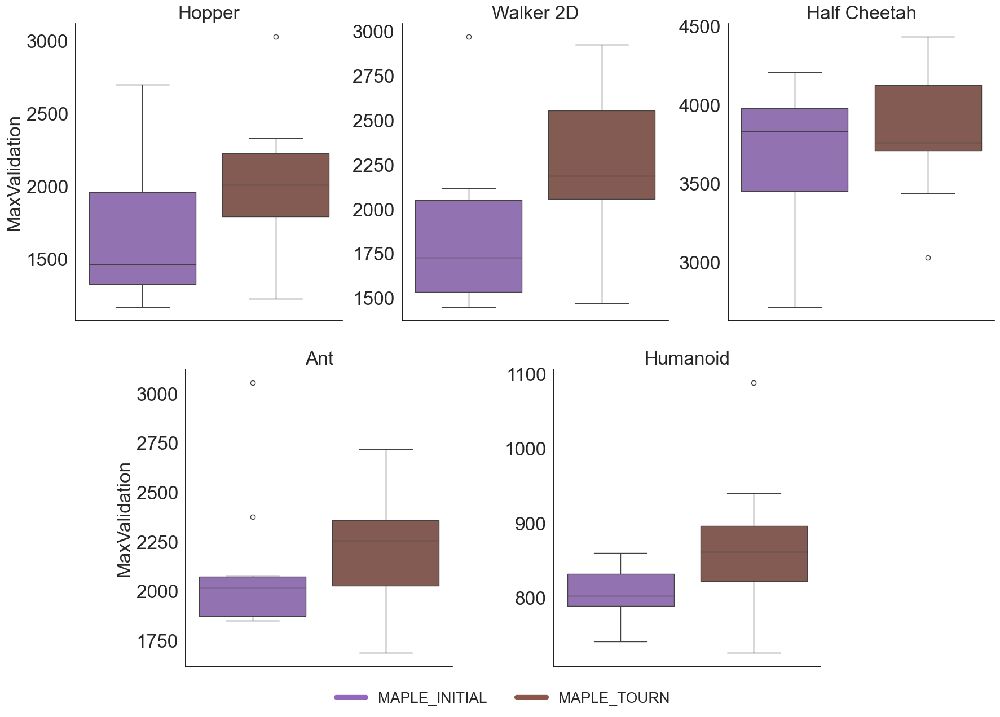

In [30]:
printBoxPlot("MaxValidation", last_generations_tournament_only, "oldNewMaple")

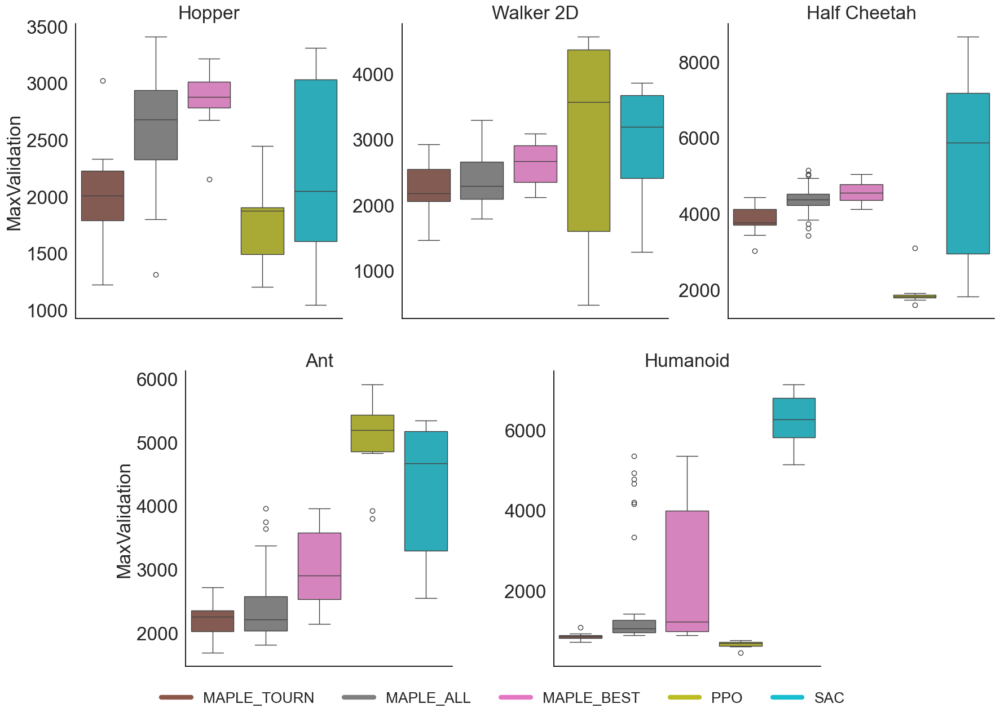

In [31]:
printBoxPlot("MaxValidation", last_generations[last_generations["legendName"].isin(["MAPLE_TOURN", "MAPLE_ALL", "MAPLE_BEST", "SAC", "PPO"])], "mainBoxPlot")

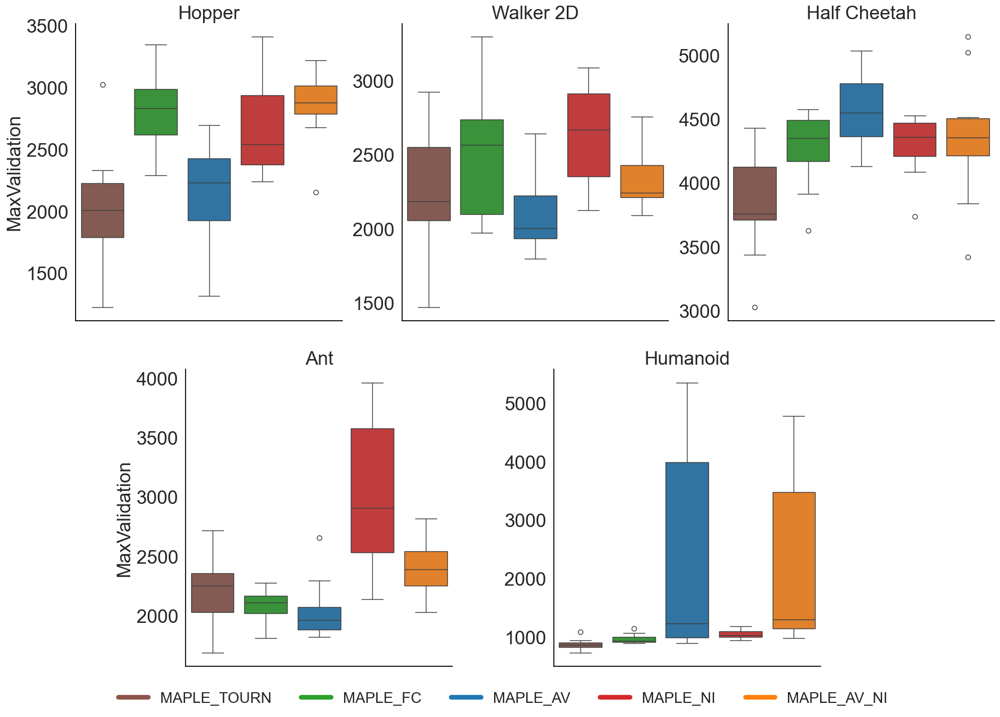

In [32]:
printBoxPlot("MaxValidation", last_generations[last_generations["legendName"].isin(["MAPLE_TOURN", "MAPLE_AV", "MAPLE_FC", "MAPLE_NI", "MAPLE_AV_NI"])], "mapElitesBoxPlot")

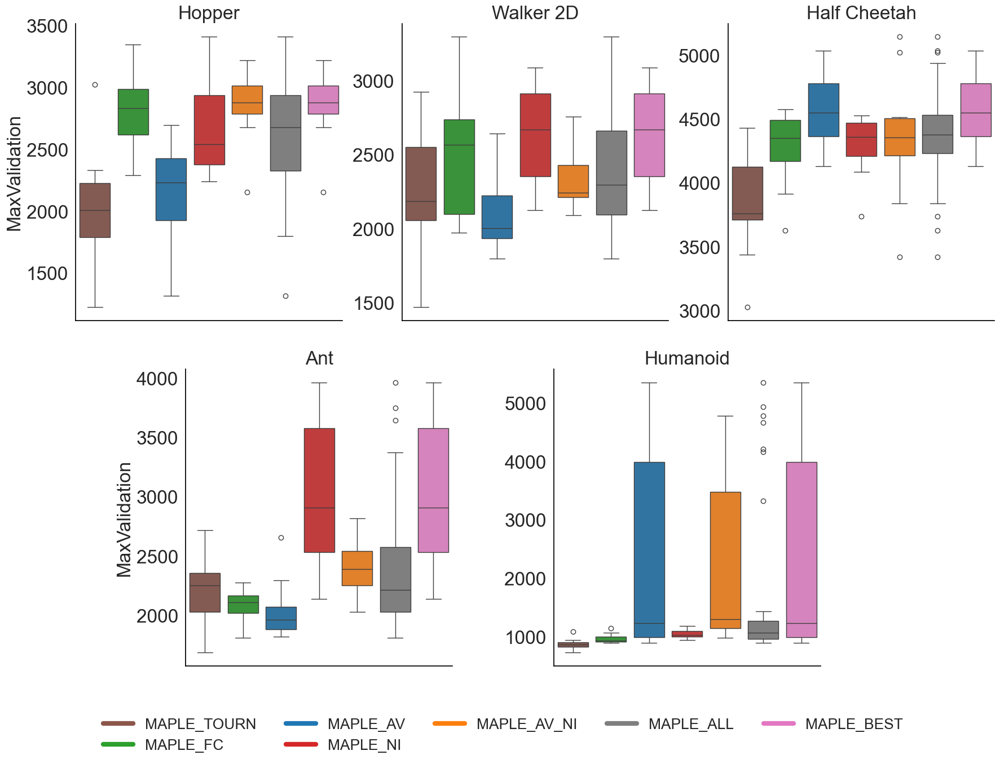

In [33]:
printBoxPlot("MaxValidation", pd.concat((last_generations_main, last_generations_low)))

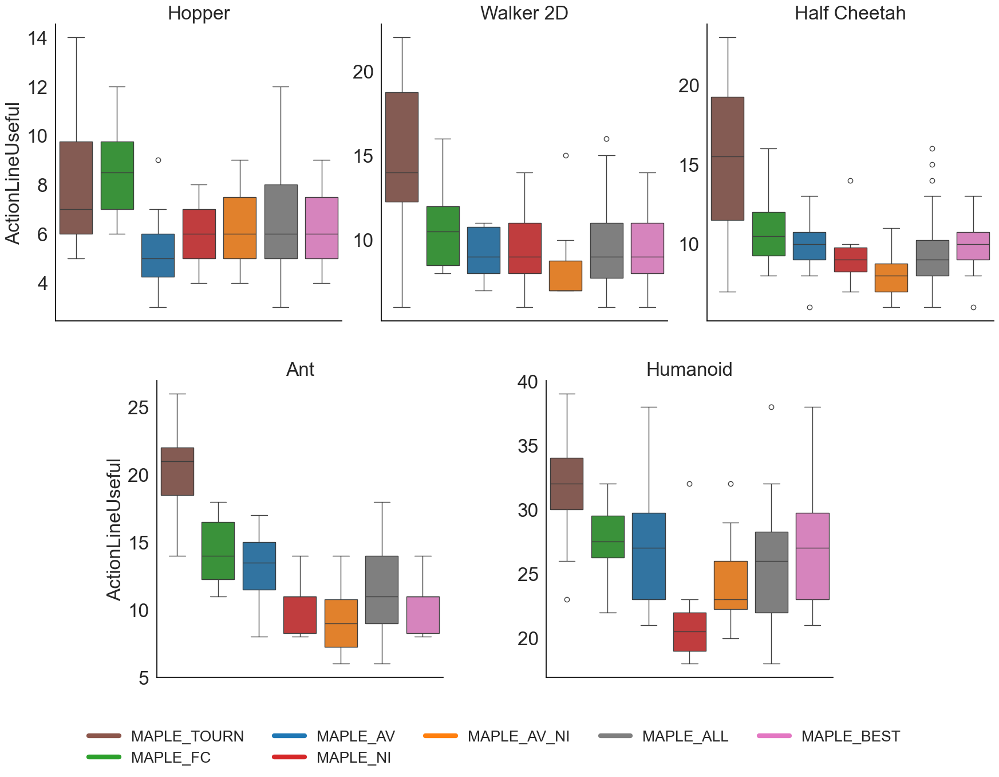

In [34]:
printBoxPlot("ActionLineUseful", pd.concat((last_generations_main, last_generations_low)))

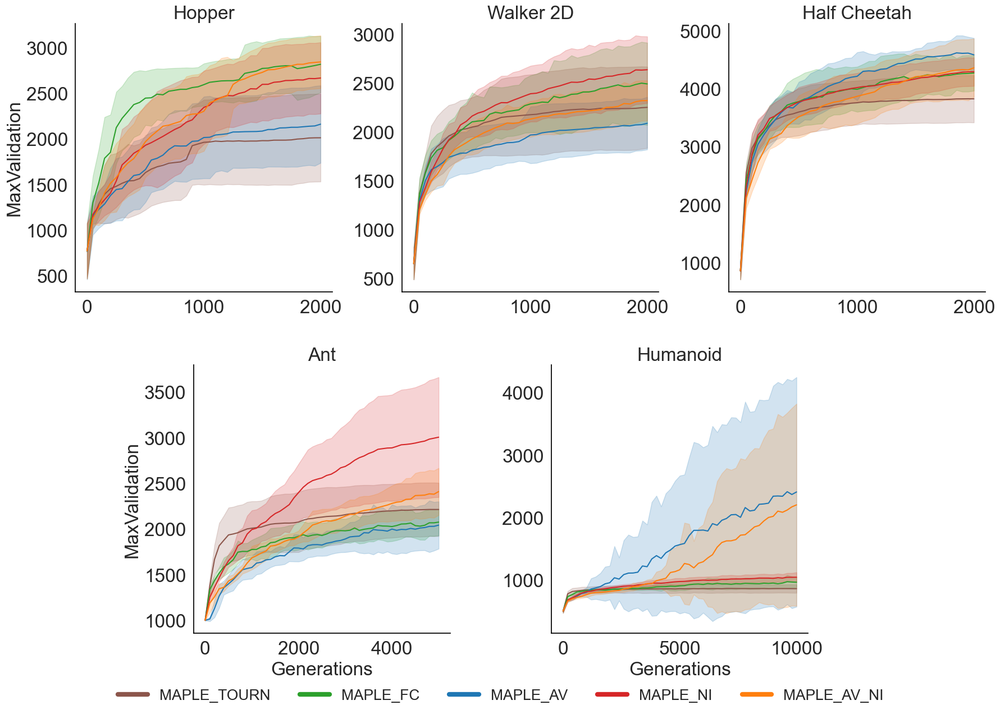

In [35]:
printLinePlot("MaxValidation", df[df['legendName'].isin(["MAPLE_TOURN", "MAPLE_AV", "MAPLE_FC", "MAPLE_NI", "MAPLE_AV_NI"])], "mapleTrainingResults")

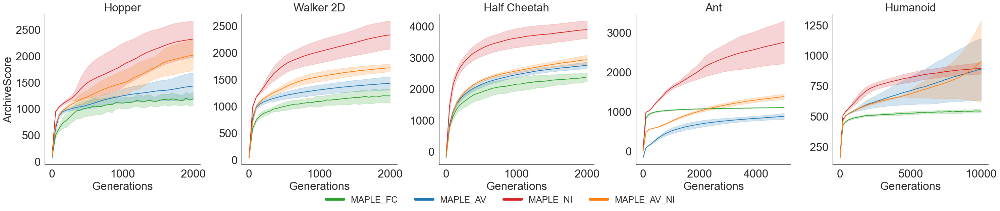

In [36]:
df["ArchiveScore"] = df["AvgValidation"]
printLinePlot("ArchiveScore", df[df['legendName'].isin(["MAPLE_AV", "MAPLE_FC", "MAPLE_NI", "MAPLE_AV_NI"])], "averageScore", small=True)

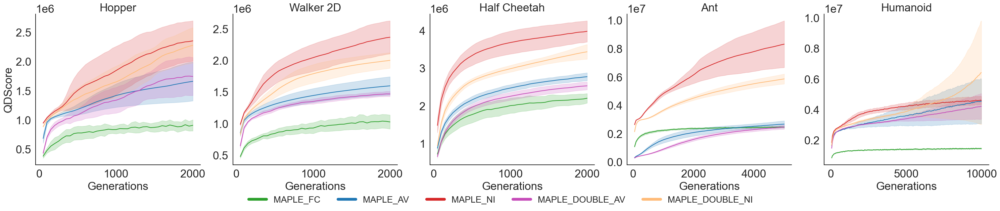

In [37]:
colorByNames["MAPLE_DOUBLE_AV"] = len(colorByNames)
colorByNames["MAPLE_DOUBLE_NI"] = len(colorByNames)
printLinePlot("QDScore", qd_scores, "QD-Score", small=True)

In [38]:
print(colorByNames)

{'MAPLE_AV': 0, 'MAPLE_AV_NI': 1, 'MAPLE_FC': 2, 'MAPLE_NI': 3, 'MAPLE_INITIAL': 4, 'MAPLE_TOURN': 5, 'MAPLE_BEST': 6, 'MAPLE_ALL': 7, 'PPO': 8, 'SAC': 9, 'MAPLE_DOUBLE_AV': 10, 'MAPLE_DOUBLE_NI': 11}


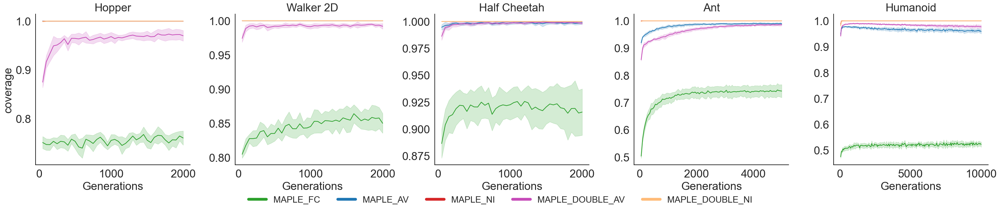

In [39]:
printLinePlot("coverage", qd_scores, "Coverage", small=True)

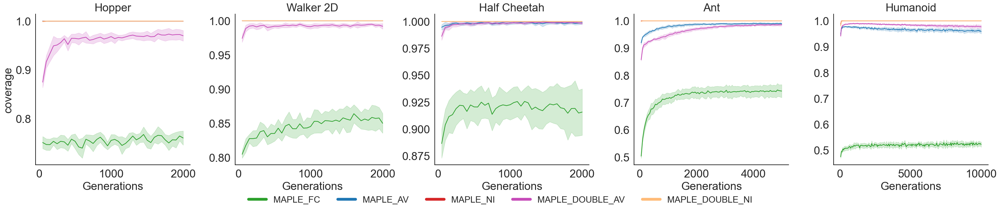

In [40]:
printLinePlot("coverage", qd_scores, "Coverage", small=True)

In [41]:
print(qd_scores.head())

   seed  generation                   folder  archiveName environment  order  type       QDScore  coverage    Gen legendName
0     0        50.0  MAP_ELITES_FEET_CONTACT  FeetContact      hopper      7  Main  397505.22029     0.752   50.0   MAPLE_FC
1     0       100.0  MAP_ELITES_FEET_CONTACT  FeetContact      hopper      7  Main  447765.41624     0.732  100.0   MAPLE_FC
2     0       150.0  MAP_ELITES_FEET_CONTACT  FeetContact      hopper      7  Main  515044.70921     0.764  150.0   MAPLE_FC
3     0       200.0  MAP_ELITES_FEET_CONTACT  FeetContact      hopper      7  Main  545318.44150     0.749  200.0   MAPLE_FC
4     0       250.0  MAP_ELITES_FEET_CONTACT  FeetContact      hopper      7  Main  532148.75621     0.747  250.0   MAPLE_FC


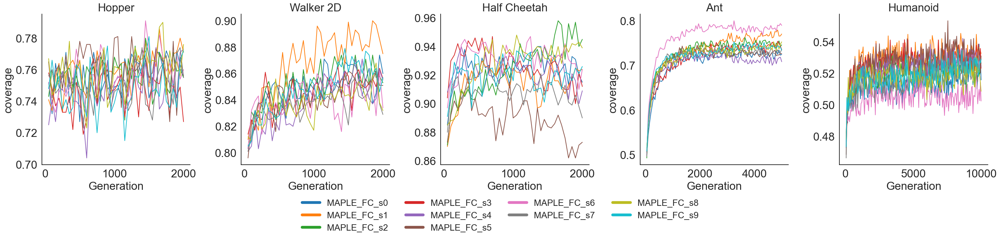

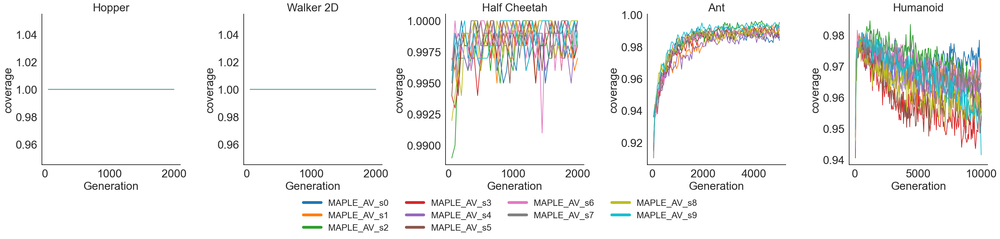

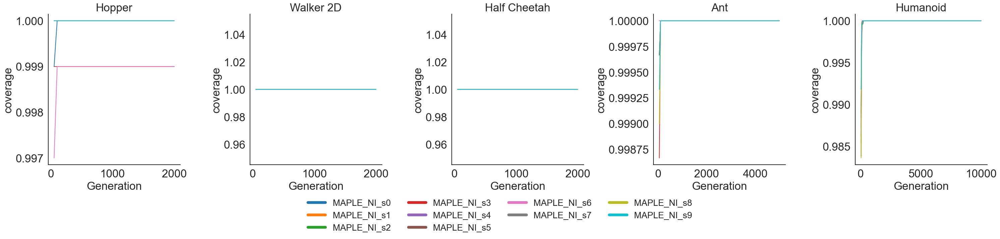

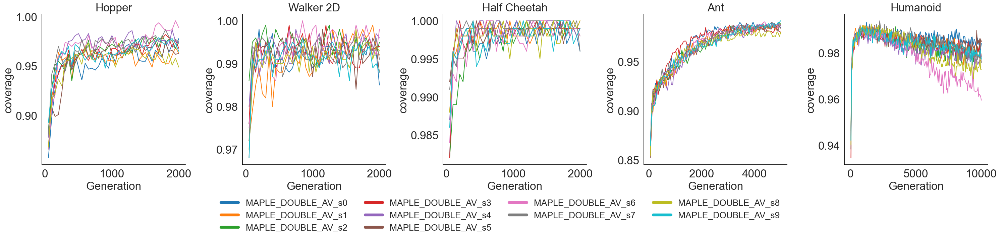

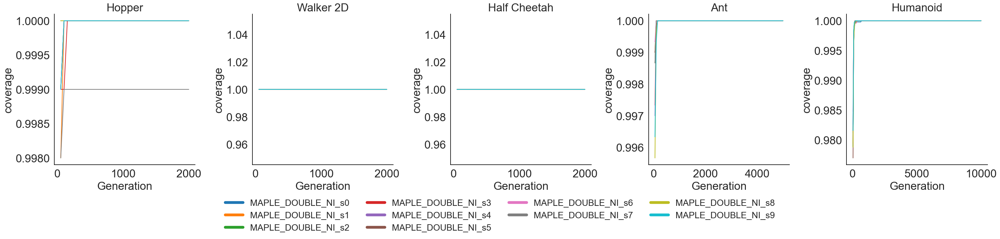

In [42]:

for folder in qd_scores["legendName"].unique():
    printLinePlotEachSeed("coverage", qd_scores[qd_scores["legendName"] == folder])

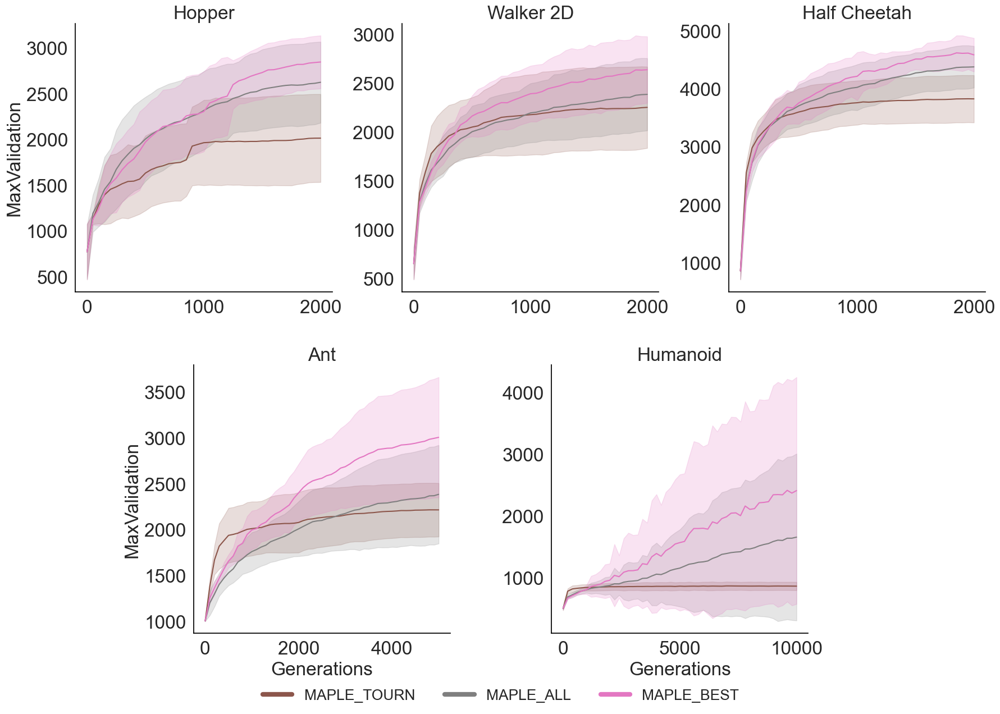

In [43]:
printLinePlot("MaxValidation", df[df['legendName'].isin(["MAPLE_TOURN", "TPG", "MATPG", "MAPLE_ALL", "MAPLE_BEST"])], "mainTrainingResults")

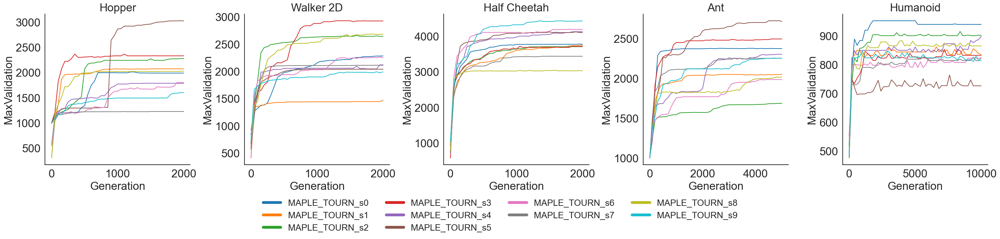

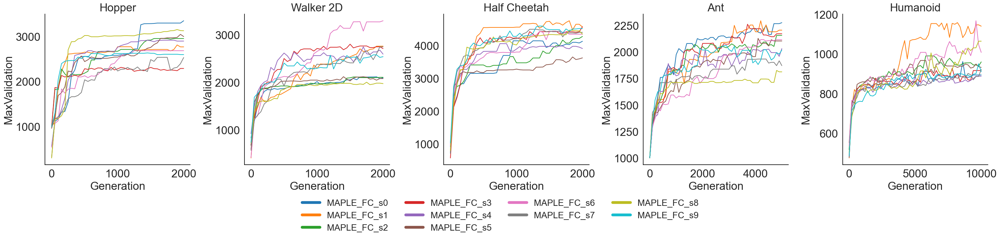

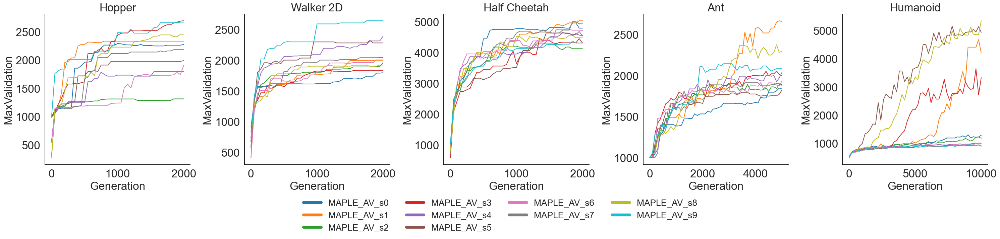

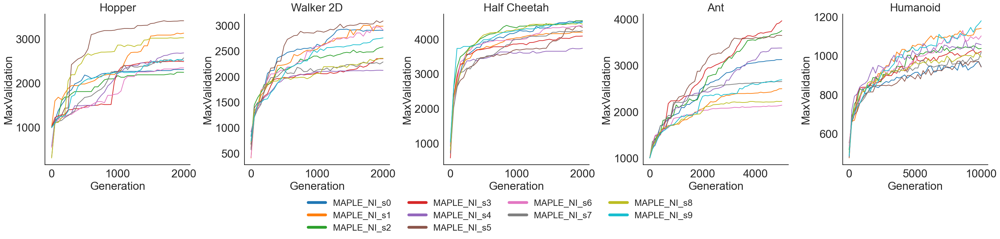

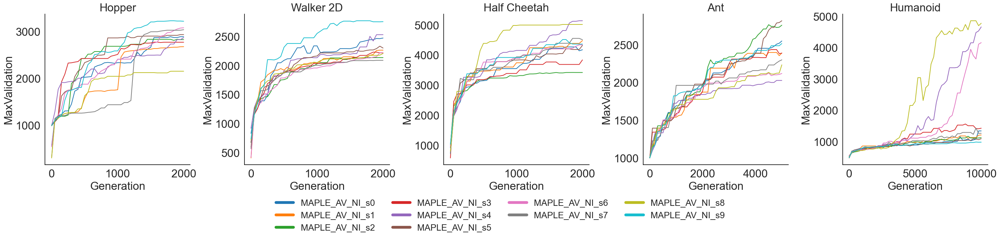

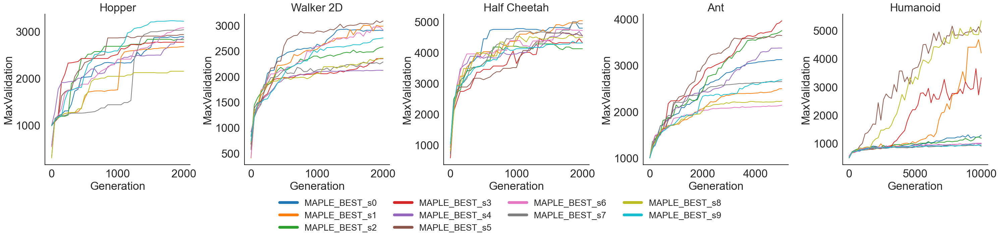

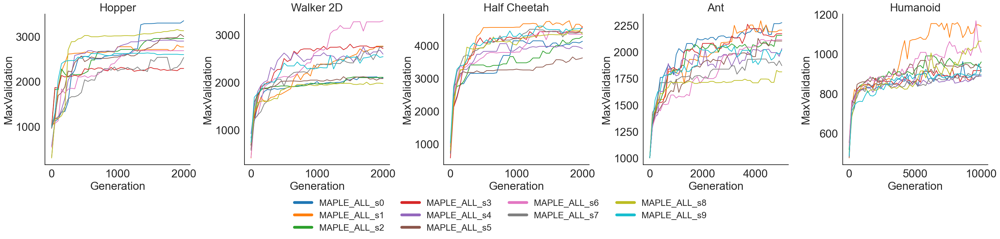

In [44]:
for folder in dfMain["folder"].unique():
    if folder == "TOURNAMENT_CLASSIC_HALF":
        continue
    printLinePlotEachSeed("MaxValidation", dfMain[(dfMain["folder"] == folder) & (dfMain["seed"] < 10)])

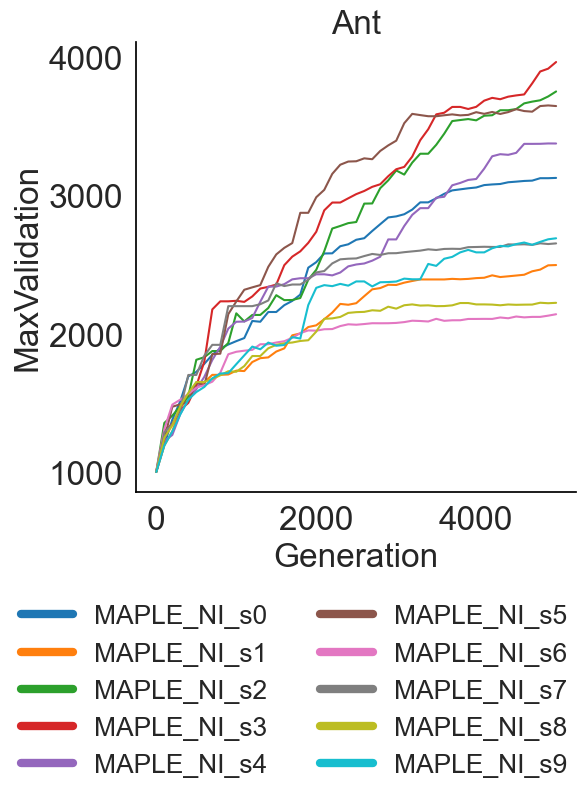

In [45]:
dfUsed = dfMain[(dfMain["environment"] == "ant") & (dfMain["folder"] == "MAP_ELITES_NB_INSTR")]
printLinePlotEachSeed("MaxValidation", dfUsed)

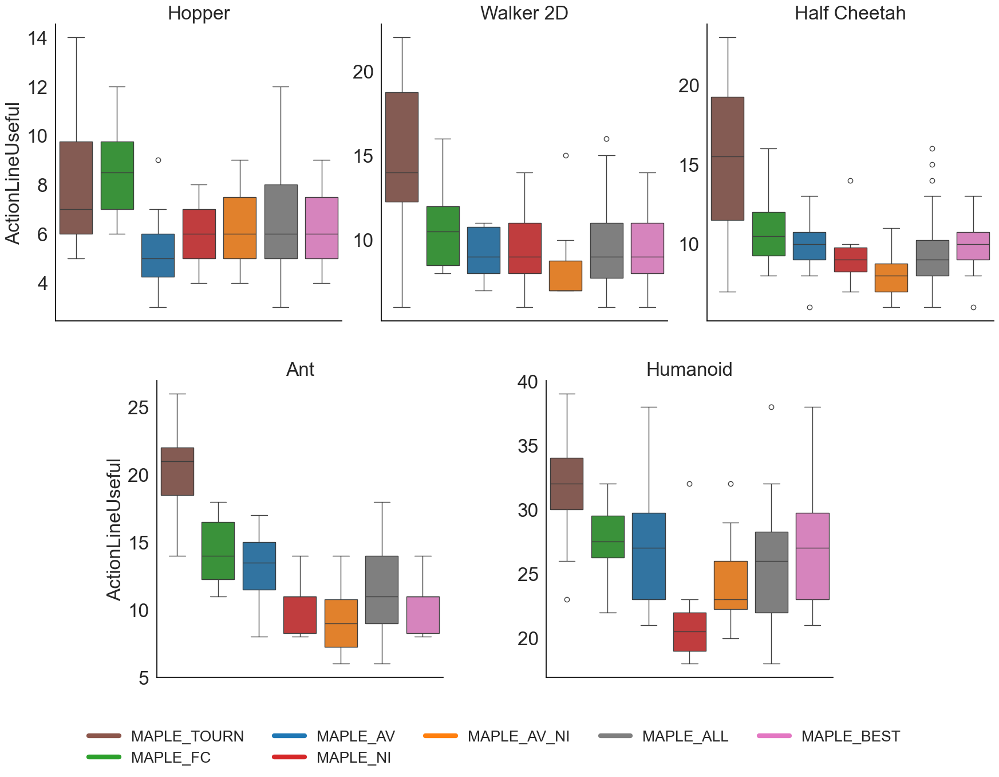

In [46]:
printBoxPlot("ActionLineUseful", last_generations_main[(last_generations_main["folder"] != "TPG") & (last_generations_main["folder"] != "MATPG")])

doubleplot with results and actionlines

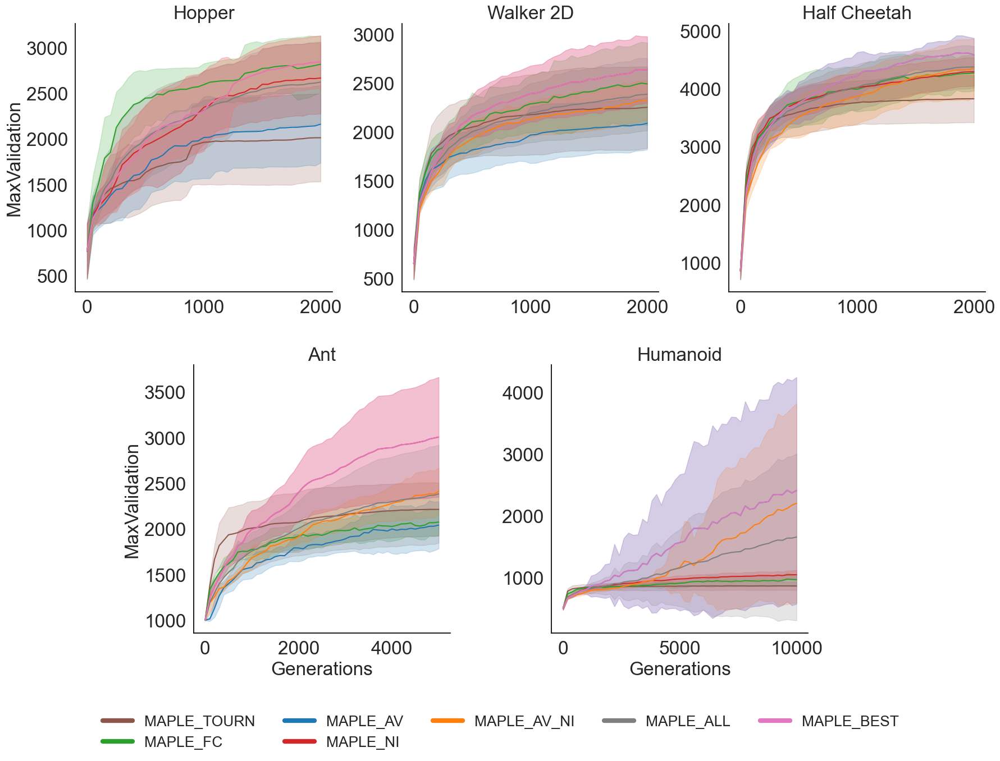

In [47]:
printLinePlot("MaxValidation", dfMain)

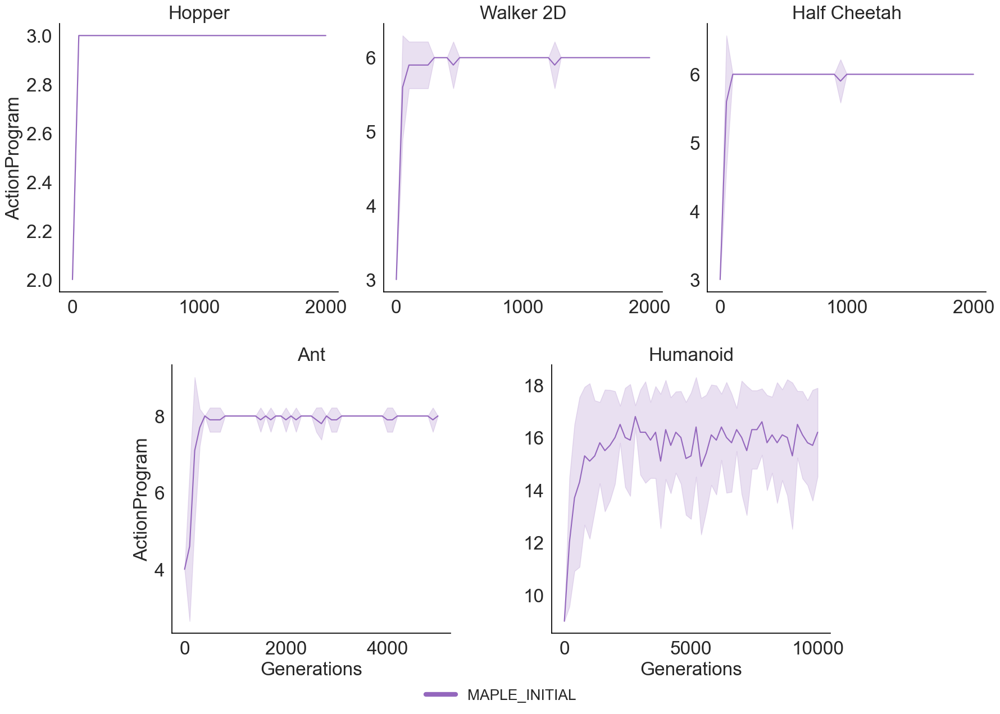

In [48]:

printLinePlot("ActionProgram", df[df['legendName'].isin(["MAPLE_INITIAL"])], "nbActionProgram")

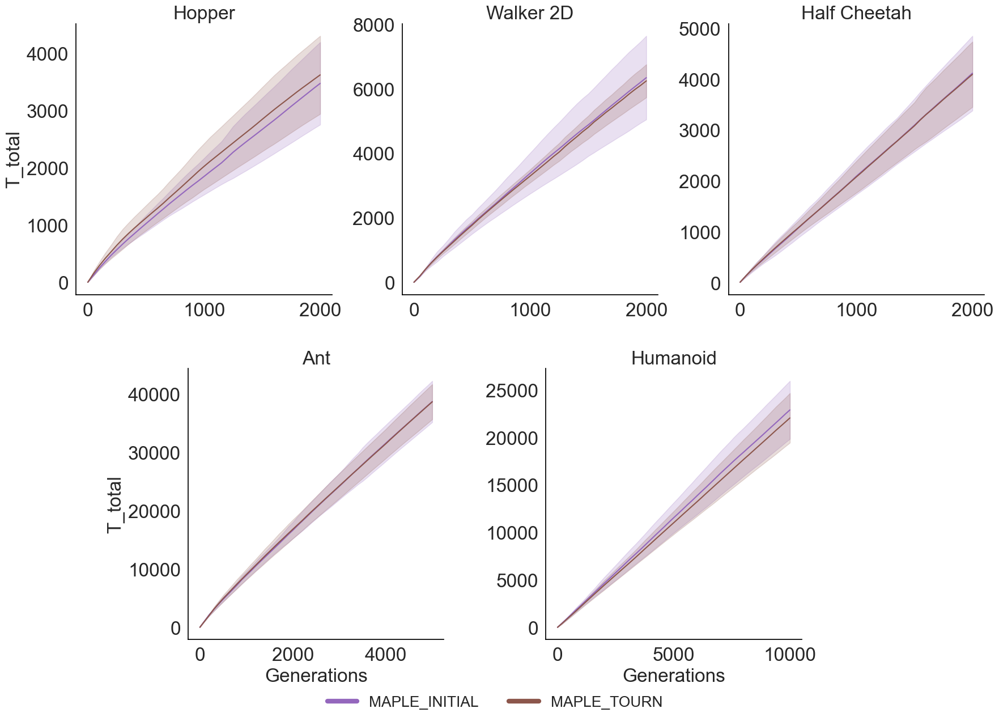

In [49]:
printLinePlot("T_total", dfTournamentOnly)

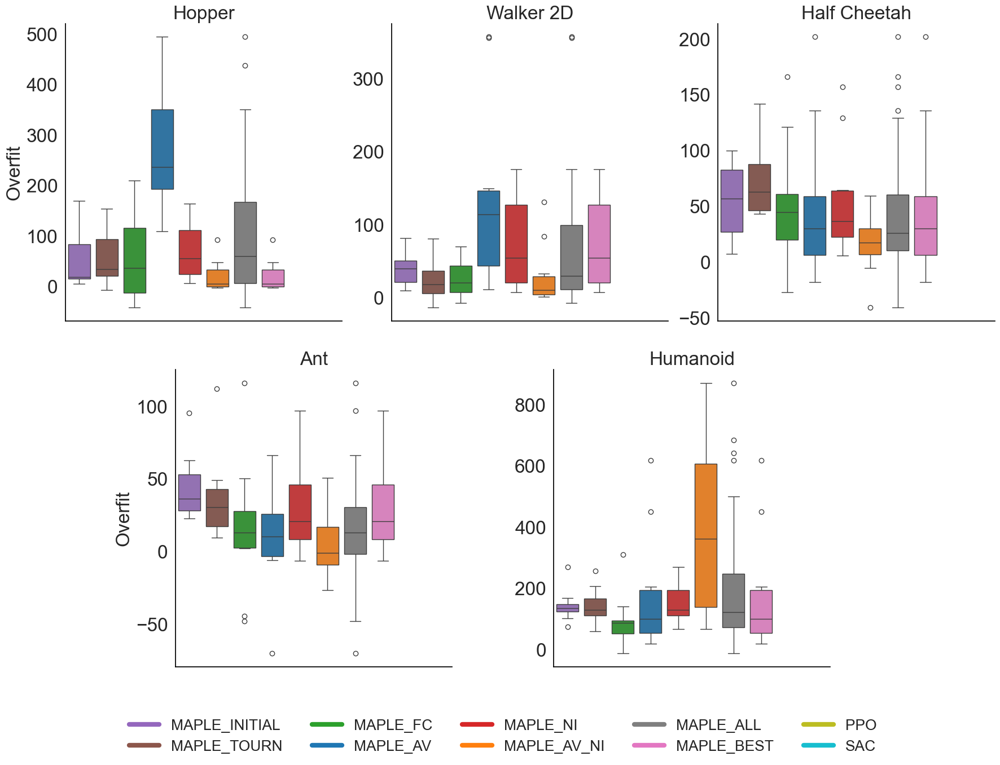

In [50]:
printBoxPlot("Overfit")

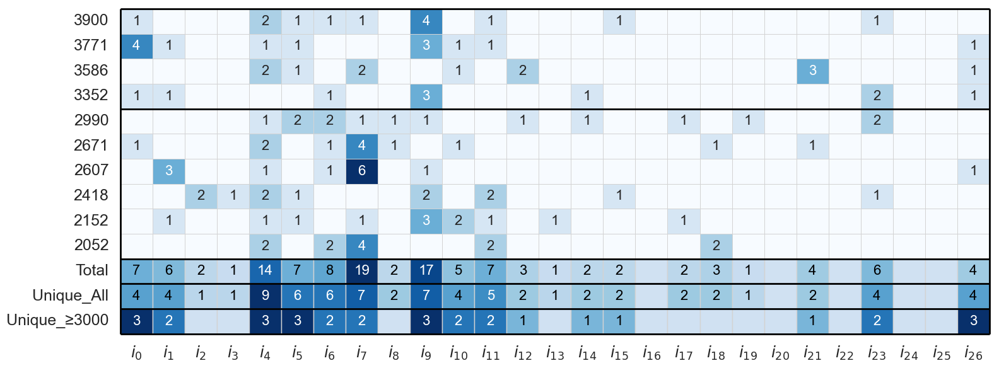

In [51]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Top 10 runs
scores = [3900,3771,3586,3352,2990,2671,2607,2418,2152,2052]
runs = np.array([
    [1,0,0,0,2,1,1,1,0,4,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0],
    [4,1,0,0,1,1,0,0,0,3,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1],
    [0,0,0,0,2,1,0,2,0,0,1,0,2,0,0,0,0,0,0,0,0,3,0,0,0,0,1],
    [1,1,0,0,0,0,1,0,0,3,0,0,0,0,1,0,0,0,0,0,0,0,0,2,0,0,1],
    [0,0,0,0,1,2,2,1,1,1,0,0,1,0,1,0,0,1,0,1,0,0,0,2,0,0,0],
    [1,0,0,0,2,0,1,4,1,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0],
    [0,3,0,0,1,0,1,6,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1],
    [0,0,2,1,2,1,0,0,0,2,0,2,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0],
    [0,1,0,0,1,1,0,1,0,3,2,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0],
    [0,0,0,0,2,0,2,4,0,0,0,2,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0]
])

# Summary rows
total_row = np.array([7,6,2,1,14,7,8,19,2,17,5,7,3,1,2,2,0,2,3,1,0,4,0,6,0,0,4])
unique_all_row = np.array([4,4,1,1,9,6,6,7,2,7,4,5,2,1,2,2,0,2,2,1,0,2,0,4,0,0,4])
unique_3000_row = np.array([3,2,0,0,3,3,2,2,0,3,2,2,1,0,1,1,0,0,0,0,0,1,0,2,0,0,3])
summary = np.vstack([total_row, unique_all_row, unique_3000_row])

# Combine labels
all_labels = [*scores, "Total", "Unique_All", "Unique_≥3000"]

plt.figure(figsize=(16,6))
ax = plt.gca()

# Create annotation array: show number only if > 0
annot_array = np.where(runs != 0, runs, "")

sns.heatmap(
    runs,
    cmap="Blues",
    annot=annot_array,  # only non-zero numbers
    fmt="",
    linewidths=0.5,
    linecolor="lightgray",
    xticklabels=[rf"$i_{{{i}}}$" for i in range(27)],
    yticklabels=scores,
    cbar=False,
    ax=ax,
    annot_kws={"size": 16}
)

for i, row in enumerate(summary):
    row_idx = 10 + i  # position of the row
    row_max = row.max() if row.max() > 0 else 1
    normalized = row / row_max  # independent scale
    for j, val in enumerate(row):
        color = plt.cm.Blues(0.2 + 0.8*normalized[j])
        ax.add_patch(plt.Rectangle((j, row_idx), 1, 1, color=color, ec='lightgray'))

        if val != 0:
            # Compute brightness and switch text color
            r, g, b, _ = color  # get RGB values
            brightness = 0.299*r + 0.587*g + 0.114*b  # perceived brightness
            text_color = "white" if brightness < 0.5 else "black"
            ax.text(j+0.5, row_idx+0.5, str(val), ha='center', va='center', color=text_color, fontsize=16)

# 3️⃣ Add horizontal separators
# Between high-score runs (>=3000) and rest
ax.hlines(y=4, xmin=0, xmax=27, colors='black', linewidth=2)  # optional: separating top 4 runs if needed
# Between runs and Total row
ax.hlines(y=10, xmin=0, xmax=27, colors='black', linewidth=2)
# Between Total, Unique_All, Unique_≥3000
ax.hlines(y=11, xmin=0, xmax=27, colors='black', linewidth=2)
ax.hlines(y=12, xmin=0, xmax=27, colors='black', linewidth=2)
ax.hlines(y=13, xmin=0, xmax=27, colors='black', linewidth=2)
ax.hlines(y=0, xmin=0, xmax=27, colors='black', linewidth=2)
ax.vlines(ymin=0, ymax=13, x=0, colors='black', linewidth=2)
ax.vlines(ymin=0, ymax=13, x=26.999, colors='black', linewidth=2)
ax.set_ylim(13.1, -0.1)
ax.set_xlim(-0.1, 27.1)

ax.tick_params(axis='both', labelsize=18)
# Adjust y-axis ticks to center of cells
plt.yticks(ticks=np.arange(len(all_labels))+0.5, labels=all_labels, rotation=0)
plt.tight_layout()
for text in ax.texts:
    text.set_clip_on(False)
plt.savefig(f'exported_results/featureSelection.pdf', format="pdf", dpi=100, transparent=True, bbox_inches='tight')
plt.show()

C:\Users\qvacher\AppData\Local\Temp\ipykernel_2204\1047293107.py:106: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


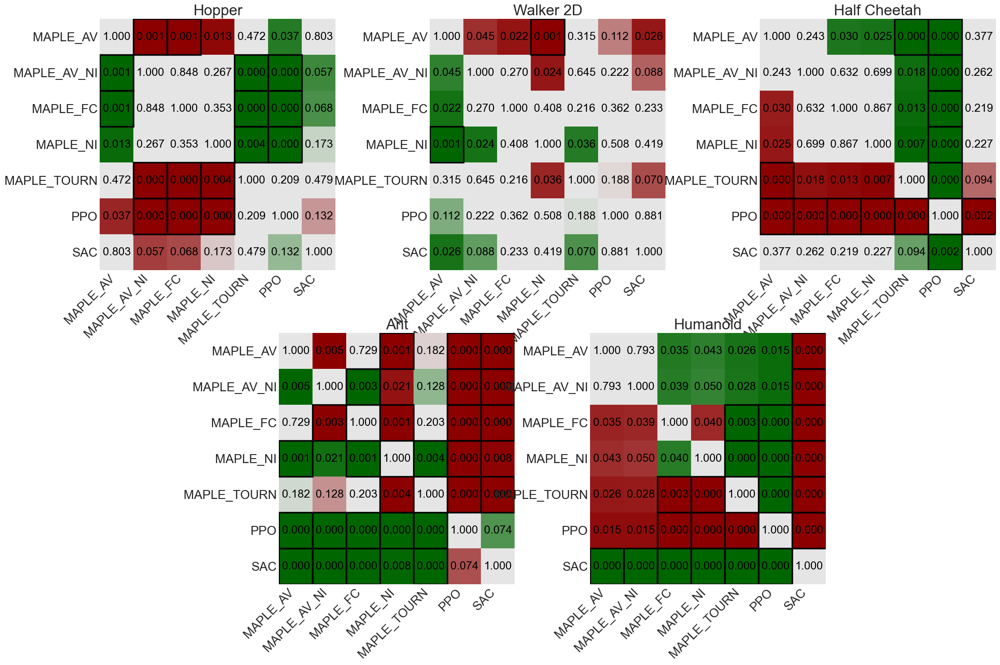

C:\Users\qvacher\AppData\Local\Temp\ipykernel_2204\1047293107.py:178: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


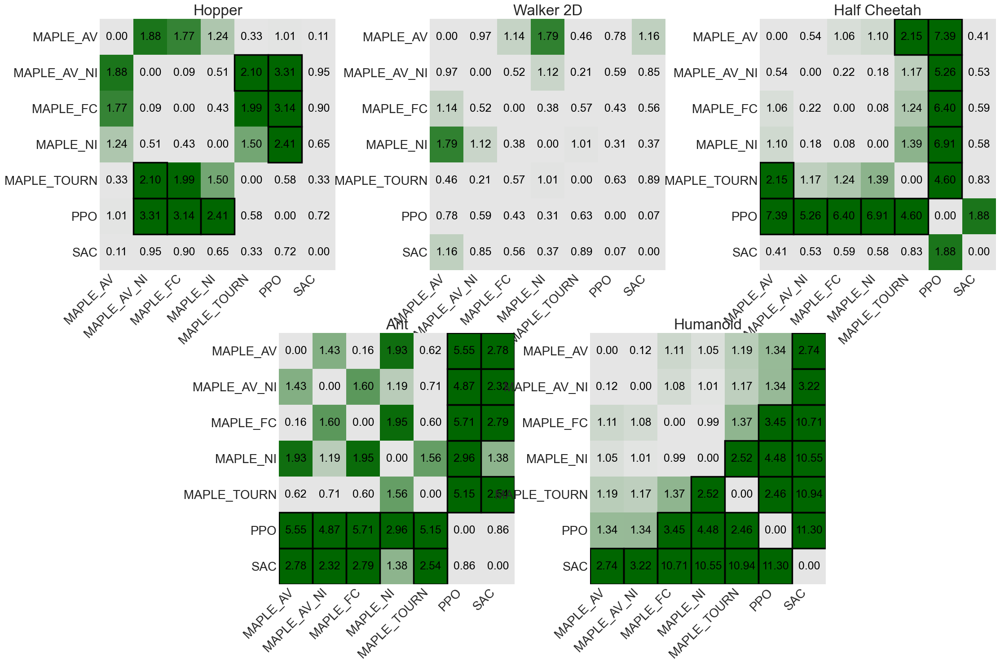

array(['MAPLE_AV', 'MAPLE_AV_NI', 'MAPLE_FC', 'MAPLE_NI', 'MAPLE_INITIAL',
       'MAPLE_TOURN', 'MAPLE_BEST', 'MAPLE_ALL', 'PPO', 'SAC'],
      dtype=object)

In [52]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from scipy.stats import ttest_ind

alpha = 0.05 / 10

dfCompared = last_generations[last_generations["legendName"].isin([
    "SAC", "PPO", "MAPLE_TOURN", "MAPLE_AV", "MAPLE_FC", "MAPLE_NI", "MAPLE_AV_NI"
])]
df_environments = list(dfCompared['environment'].drop_duplicates())
used_environments = [env for env in environments if env in df_environments]

size = (21, 14)  # Figure size

# -------------------------------
# FIRST VISUALIZATION: P-VALUE MATRIX
# -------------------------------

fig = plt.figure(figsize=size)
axes = []

# Positions: [left, bottom, width, height] in figure coordinates
top_y = 0.55
bottom_y = 0.05
height = 0.4
width = 0.25

# Top row (3 environments)
axes.append(fig.add_axes([0.02, top_y, width, height]))
axes.append(fig.add_axes([0.37, top_y, width, height]))
axes.append(fig.add_axes([0.72, top_y, width, height]))

# Bottom row (2 environments, centered)
axes.append(fig.add_axes([0.21, bottom_y, width, height]))
axes.append(fig.add_axes([0.54, bottom_y, width, height]))

white = np.array([0.9, 0.9, 0.9])
green = np.array([0.0, 0.4, 0.0])
red = np.array([0.55, 0.0, 0.0])

for idx, env in enumerate(used_environments):
    ax = axes[idx]
    dfUsed = dfCompared[dfCompared["environment"] == env]

    # Get scenarios and labels
    scenarios = list(dfUsed.groupby(['legendName']).groups.keys())
    labels = [f"{f}" for f in scenarios]

    # Initialize p-value matrix
    p_matrix = np.ones((len(scenarios), len(scenarios)))

    # Store medians
    medians = {s: dfUsed.groupby(['legendName']).get_group((s,))['MaxValidation'].median() for s in scenarios}

    # Compute p-values
    for i, s1 in enumerate(scenarios):
        for j, s2 in enumerate(scenarios):
            if i < j:
                data1 = dfUsed.groupby(['legendName']).get_group((s1,))['MaxValidation']
                data2 = dfUsed.groupby(['legendName']).get_group((s2,))['MaxValidation']
                stat, p = ttest_ind(data1, data2, equal_var=False)
                p_matrix[i, j] = p
                p_matrix[j, i] = p

    # Generate RGB color matrix
    color_matrix = np.zeros((p_matrix.shape[0], p_matrix.shape[1], 3))
    for i in range(p_matrix.shape[0]):
        for j in range(p_matrix.shape[1]):
            if i == j:
                color_matrix[i, j] = white
            else:
                p_val = p_matrix[i, j]
                if p_val < alpha:
                    color_matrix[i, j] = red if medians[scenarios[j]] > medians[scenarios[i]] else green
                elif p_val < 0.2:
                    p_norm = (p_val - alpha) / (0.2 - alpha)
                    p_norm = min(max(p_norm, 0), 1)
                    color_matrix[i, j] = (red * (1 - p_norm) + white * p_norm
                                          if medians[scenarios[j]] > medians[scenarios[i]]
                                          else green * (1 - p_norm) + white * p_norm)
                else:
                    color_matrix[i, j] = white

    ax.imshow(color_matrix, aspect='auto', interpolation='nearest')

    # Annotate p-values
    for i in range(p_matrix.shape[0]):
        for j in range(p_matrix.shape[1]):
            ax.text(j, i, f"{p_matrix[i,j]:.3f}", ha='center', va='center', color='black',  fontsize=18)
            if i != j and p_matrix[i, j] < alpha:
                rect = plt.Rectangle((j - 0.5, i - 0.5), 1, 1, fill=False, edgecolor='black', linewidth=2.5)
                ax.add_patch(rect)

    # Format axes
    ax.set_xticks(np.arange(len(labels)))
    ax.set_yticks(np.arange(len(labels)))
    ax.set_xticklabels(labels, rotation=45, ha='right')
    ax.set_yticklabels(labels)
    ax.set_title(beautifulEnvName[env], fontsize=24)
    ax.tick_params(axis='both', labelsize=20, length=0)
    ax.grid(False)
    for spine in ax.spines.values():
        spine.set_visible(False)

plt.tight_layout()
plt.savefig(f'exported_results/pvalues.pdf', format="pdf", dpi=100, transparent=True, bbox_inches='tight')
plt.show()

# -------------------------------
# SECOND VISUALIZATION: EFFECT SIZE MATRIX
# -------------------------------

fig = plt.figure(figsize=size)
axes = []

# Top row (3 environments)
axes.append(fig.add_axes([0.02, top_y, width, height]))
axes.append(fig.add_axes([0.37, top_y, width, height]))
axes.append(fig.add_axes([0.72, top_y, width, height]))

# Bottom row (2 environments, centered)
axes.append(fig.add_axes([0.21, bottom_y, width, height]))
axes.append(fig.add_axes([0.54, bottom_y, width, height]))

for idx, env in enumerate(used_environments):
    ax = axes[idx]
    dfUsed = dfCompared[dfCompared["environment"] == env]

    gen_stats = (dfUsed.groupby(['legendName'])['MaxValidation']
                 .agg(['mean', 'std']).reset_index().rename(columns={'mean': 'Mean', 'std': 'Std'}))
    n_scenarios = len(gen_stats)

    effect_size_matrix = np.zeros((n_scenarios, n_scenarios))
    for i in range(n_scenarios):
        for j in range(n_scenarios):
            sigmaPool = np.sqrt((gen_stats.iloc[i]["Std"]**2 + gen_stats.iloc[j]["Std"]**2) / 2)
            effect_size_matrix[i, j] = abs(gen_stats.iloc[i]["Mean"] - gen_stats.iloc[j]["Mean"]) / sigmaPool

    # Generate RGB color matrix
    color_matrix = np.zeros((n_scenarios, n_scenarios, 3))
    for i in range(n_scenarios):
        for j in range(n_scenarios):
            if i == j:
                color_matrix[i, j] = white
            else:
                effect_size = effect_size_matrix[i, j]
                if effect_size > 2:
                    color_matrix[i, j] = green
                elif effect_size > 1:
                    p_norm = (effect_size - 1)
                    p_norm = min(max(p_norm, 0), 1)
                    color_matrix[i, j] = green * p_norm + white * (1 - p_norm)
                else:
                    color_matrix[i, j] = white

    ax.imshow(color_matrix, aspect='auto', interpolation='nearest')

    # Annotate effect sizes
    for i in range(n_scenarios):
        for j in range(n_scenarios):
            ax.text(j, i, f"{effect_size_matrix[i, j]:.2f}", ha='center', va='center', color='black',  fontsize=18)
            if i != j and effect_size_matrix[i, j] > 2:
                rect = plt.Rectangle((j - 0.5, i - 0.5), 1, 1, fill=False, edgecolor='black', linewidth=2.5)
                ax.add_patch(rect)

    labels = gen_stats["legendName"].values
    ax.set_xticks(np.arange(n_scenarios))
    ax.set_yticks(np.arange(n_scenarios))
    ax.set_xticklabels(labels, rotation=45, ha='right', )
    ax.set_yticklabels(labels)
    ax.set_title(beautifulEnvName[env], fontsize=24)
    ax.tick_params(axis='both', labelsize=20, length=0)
    for spine in ax.spines.values():
        spine.set_visible(False)
    ax.grid(False)

plt.tight_layout()
plt.savefig(f'exported_results/effectiveSize.pdf', format="pdf", dpi=100, transparent=True, bbox_inches='tight')
plt.show()

last_generations["legendName"].unique()

Distance matrix:
 [[0.         1.12495503 1.64656394 1.4654655  1.3212996  1.53105763]
 [1.12495503 0.         1.47861046 1.19788385 1.11611691 1.2926063 ]
 [1.64656394 1.47861046 0.         1.41799696 1.3561207  1.33885146]
 [1.4654655  1.19788385 1.41799696 0.         1.3245831  1.41779512]
 [1.3212996  1.11611691 1.3561207  1.3245831  0.         1.43892741]
 [1.53105763 1.2926063  1.33885146 1.41779512 1.43892741 0.        ]]


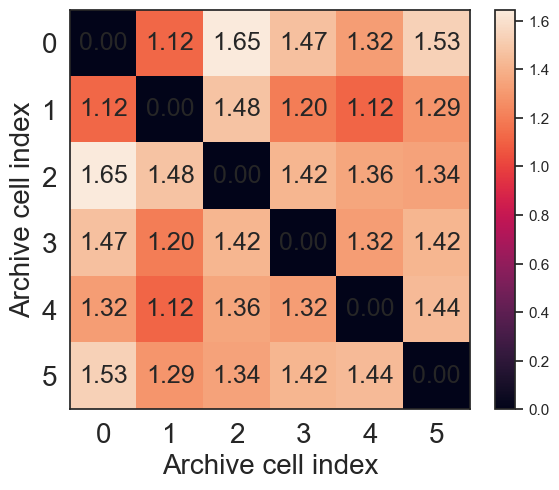

In [53]:

points = np.array([
    [0.4244, 0.194038, 0.134742, 0.210518, 0.902325, 0.353828, 0.631859, 0.228129, 0.897375, 0.831194, 0.498731, 0.306868, 0.252658, 0.580495, 0.728401, 0.337565, 0.668336],
    [0.286033, 0.436448, 0.654666, 0.317855, 0.784836, 0.558307, 0.412904, 0.377204, 0.709432, 0.932443, 0.759426, 0.556721, 0.826275, 0.152861, 0.518498, 0.168201, 0.80755],
    [0.730307, 0.726642, 0.390414, 0.821499, 0.18968, 0.716581, 0.332299, 0.223935, 0.0830737, 0.777528, 0.154271, 0.499914, 0.810745, 0.707244, 0.716231, 0.220403, 0.615736],
    [0.583422, 0.334498, 0.809741, 0.313115, 0.570228, 0.601811, 0.237913, 0.653021, 0.444986, 0.757816, 0.0995846, 0.887574, 0.373767, 0.103327, 0.466884, 0.540064, 0.402666],
    [0.446723, 0.208794, 0.815757, 0.422227, 0.573842, 0.528364, 0.863991, 0.44398, 0.396856, 0.797768, 0.481469, 0.423215, 0.832574, 0.791344, 0.186616, 0.553009, 0.775553],
    [0.248915, 0.595185, 0.799872, 0.850962, 0.0481102, 0.160558, 0.791287, 0.184582, 0.632836, 0.801717, 0.267578, 0.558033, 0.468311, 0.100843, 0.764806, 0.16527, 0.771092]
])

# Compute pairwise Euclidean distance matrix
n = points.shape[0]
dist_matrix = np.zeros((n, n))

for i in range(n):
    for j in range(n):
        dist_matrix[i, j] = np.linalg.norm(points[i] - points[j])

# Print the matrix
print("Distance matrix:\n", dist_matrix)

# Plot heatmap
plt.figure(figsize=(6, 5))
plt.imshow(dist_matrix)
plt.colorbar(label="")
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.xlabel("Archive cell index", fontsize=20)
plt.ylabel("Archive cell index", fontsize=20)

# Optional: show values on the heatmap
for i in range(n):
    for j in range(n):
        plt.text(j, i, f"{dist_matrix[i, j]:.2f}",
                 ha="center", va="center", fontsize=18)

plt.tight_layout()
plt.savefig(f'exported_results/distanceCorrelationHumanoid.pdf', format="pdf", dpi=100, transparent=True, bbox_inches='tight')
plt.show()